# Import library 

In [1]:
!pip install missingno

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno
import tensorflow_addons as tfa
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE

from tqdm import tqdm
from sklearn.decomposition import PCA
from IPython.core.display import clear_output
#import important libraries
%matplotlib inline
import seaborn as sns
import plotly.express as express
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from tensorflow import keras
import tensorflow as tf
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as express
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from tensorflow import keras
import tensorflow as tf
clear_output()

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#import missingno as msno
import plotly.express as px
import seaborn as sns

plt.rcParams['figure.figsize'] = [11, 7]
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'


pd.options.display.max_rows = 10
pd.options.display.float_format = "{:.1f}".format

from sklearn.neural_network import MLPClassifier

from sklearn.metrics import accuracy_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report

from sklearn.model_selection import GridSearchCV


# and setting the size of all plots.
plt.rcParams['figure.figsize'] = [11, 7]

# Read DataFrames

In [4]:
#Read the dataset
train = pd.read_csv('train.csv',  na_values=['?', 'Do not know', 'Not identifiable'], engine='python')
test = pd.read_csv('test.csv',  na_values=['?', 'Do not know', 'Not identifiable'], engine='python')
val=pd.read_csv('val.csv',  na_values=['?', 'Do not know', 'Not identifiable'], engine='python')
train

,Switch ID,Port Number,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Delta Received Packets,Delta Received Bytes,Delta Sent Bytes,...,Connection Point,Total Load/Rate,Total Load/Latest,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Active Flow Entries,Packets Looked Up,Packets Matched,Label
0,of:0000000000000004,Port#:1,240,16586,12622603,467,126,0,0,280,...,1,0,0,0,0,0,4,819,757,TCP-SYN
1,of:0000000000000004,Port#:2,158,20530,35464,376,171,4,556,3407,...,2,0,0,0,0,0,5,1018,918,TCP-SYN
2,of:0000000000000008,Port#:3,1930,37881404,67857371,414333,1297,0,0,556,...,2,0,0,0,0,0,8,987400,987276,Normal
3,of:0000000000000001,Port#:4,903,18946410,17900326,98088,176,3,320,270280,...,3,0,0,0,0,0,8,195879,195780,PortScan
4,of:000000000000000b,Port#:1,423,29020,19138042,1562,1451,0,0,560,...,1,0,0,0,0,0,4,4524,4411,Overflow
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2614,of:0000000000000008,Port#:1,646,18927937,26139,253,151,2,278,278,...,4,0,0,0,0,0,6,1563,1469,PortScan
2615,of:000000000000000b,Port#:2,3149,25488846,31784484,3205,2326,4,556,556,...,3,0,0,0,0,0,4,14774,14647,Blackhole
2616,of:000000000000000c,Port#:3,386,6324623,13285,97,101,27,526635,556,...,2,0,0,0,0,0,8,2688,2590,TCP-SYN
2617,of:000000000000000c,Port#:2,807,12638724,25268608,1238,366,47,3379,3939658,...,2,630355,6303550,630355,6303550,630355,6,3088,2976,Blackhole


In [5]:
train.describe()

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Delta Received Packets,Delta Received Bytes,Delta Sent Bytes,Delta Sent Packets,Delta Port alive Duration (S),Connection Point,Total Load/Rate,Total Load/Latest,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Active Flow Entries,Packets Looked Up,Packets Matched
count,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0
mean,19929.1,26066392.9,23726454.3,33676.6,890.5,174.9,325466.1,295717.1,160.6,4.8,2.5,20442.8,503308.7,20442.8,503308.7,20442.8,95.0,99204.6,99084.5
std,61817.9,36708011.3,33099080.0,90565.2,970.9,1028.9,1166623.9,1107859.2,972.5,0.4,1.2,114101.3,1796231.1,114101.3,1796231.1,114101.3,828.2,236317.5,236316.2
min,10.0,856.0,6025.0,44.0,26.0,0.0,0.0,278.0,2.0,4.0,1.0,-644624.0,0.0,-644624.0,0.0,-644624.0,4.0,105.0,50.0
25%,321.5,84649.0,53609.0,333.5,136.0,2.0,278.0,280.0,2.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,2263.0,2147.0
50%,1108.0,12620834.0,12621758.0,1243.0,254.0,4.0,556.0,556.0,4.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,6.0,6968.0,6843.0
75%,3268.5,37367852.5,31702186.5,3727.0,1721.0,6.0,831.0,759.0,5.0,5.0,3.0,0.0,0.0,0.0,0.0,0.0,8.0,21633.0,21408.0
max,352584.0,258942192.0,213072768.0,420806.0,3317.0,15588.0,6171714.0,6302910.0,15593.0,5.0,5.0,1260657.0,12753863.0,1260657.0,12753863.0,1260657.0,9985.0,1012220.0,1012085.0


In [115]:
test


,Switch ID,Port Number,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Delta Received Packets,Delta Received Bytes,Delta Sent Bytes,...,Connection Point,Total Load/Rate,Total Load/Latest,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Active Flow Entries,Packets Looked Up,Packets Matched,Label
0,-0.7,-0.2,-0.3,-0.7,-0.7,-0.4,-0.8,-0.2,-0.3,-0.3,...,0.5,-0.2,-0.3,-0.2,-0.3,-0.2,-0.1,-0.4,-0.4,5
1,0.9,1.8,5.3,-0.3,0.4,1.4,0.6,-0.2,-0.3,-0.3,...,1.3,-0.2,-0.3,-0.2,-0.3,-0.2,-0.1,2.3,2.3,2
2,0.9,-0.2,-0.3,-0.7,-0.5,-0.4,-0.8,-0.2,-0.3,-0.3,...,-0.4,-0.2,-0.3,-0.2,-0.3,-0.2,-0.1,-0.4,-0.4,5
3,-0.4,0.8,-0.3,-0.0,0.2,-0.3,1.3,0.0,4.0,-0.3,...,-1.3,-0.2,-0.3,-0.2,-0.3,-0.2,-0.1,-0.4,-0.4,0
4,0.9,-1.2,-0.3,-0.7,-0.7,-0.4,-0.8,-0.2,-0.3,-0.3,...,-0.4,-0.2,-0.3,-0.2,-0.3,-0.2,-0.1,-0.4,-0.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
556,1.4,-1.2,-0.3,0.2,-0.5,-0.4,0.6,-0.2,-0.3,-0.3,...,2.2,-0.2,-0.3,-0.2,-0.3,-0.2,-0.1,-0.4,-0.4,1
557,0.4,-0.2,-0.2,2.0,-0.1,-0.3,1.3,-0.2,-0.3,-0.3,...,-0.4,-0.2,-0.3,-0.2,-0.3,-0.2,-0.1,-0.3,-0.3,0
558,-1.5,-1.2,-0.3,-0.4,-0.7,-0.4,-0.8,-0.2,-0.3,-0.3,...,-0.4,-0.2,-0.3,-0.2,-0.3,-0.2,-0.1,-0.4,-0.4,5
559,-0.4,0.8,-0.3,-0.7,-0.7,-0.4,-0.8,-0.2,-0.3,-0.3,...,-0.4,-0.2,-0.3,-0.2,-0.3,-0.2,-0.1,-0.4,-0.4,5


# Exploratory Data Analysis

#### Number of instances per class


#####testing dataset 

In [6]:
test['Label'].value_counts()

TCP-SYN      156
PortScan     127
Blackhole    122
Diversion     90
Normal        49
Overflow      17
Name: Label, dtype: int64

<AxesSubplot:>

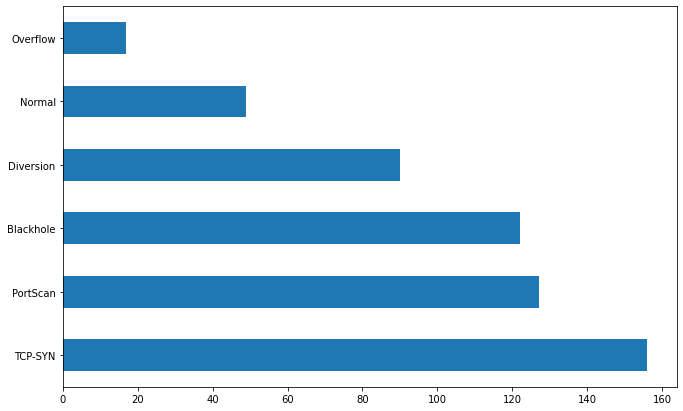

In [7]:
test['Label'].value_counts()[:561].plot(kind='barh')

#####training dataset 

In [8]:
train['Label'].value_counts()

PortScan     666
TCP-SYN      651
Blackhole    561
Diversion    414
Normal       254
Overflow      73
Name: Label, dtype: int64

<AxesSubplot:>

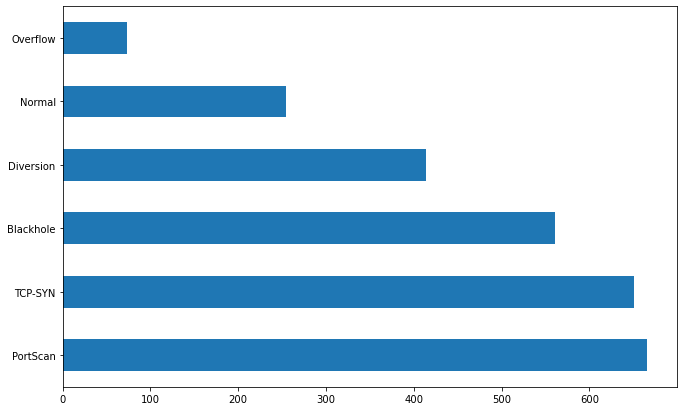

In [9]:
train['Label'].value_counts()[:2691].plot(kind='barh')

##### vakidation dataset  

In [10]:
val['Label'].value_counts()

Blackhole    143
PortScan     141
TCP-SYN      123
Diversion     92
Normal        47
Overflow      15
Name: Label, dtype: int64

<AxesSubplot:>

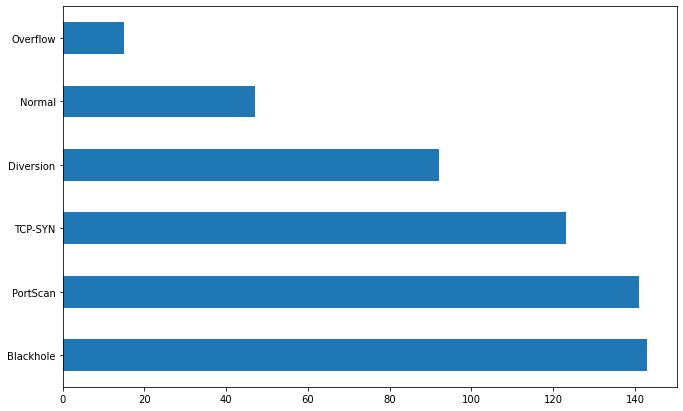

In [11]:
val['Label'].value_counts()[:561].plot(kind='barh')

#### Number of null values per feature

In [12]:
def show_missing_data(df):
    """
    Present the total number of missing values for each column and corresponding percentage.
    """
    total = df.isnull().sum()
    percent = (df.isnull().sum() / df.isnull().count() * 100)
    tt = pd.concat([total, percent], axis=1, keys=['Total Number of missing observations', 'Percent'])
    types = []
    for col in df.columns:
        dtype = str(df[col].dtype)
        types.append(dtype)
    tt['data_types'] = types
    return tt

##### Train Dataset

In [13]:
train.isna().sum()

Switch ID               0
Port Number             0
Received Packets        0
Received Bytes          0
Sent Bytes              0
                       ..
Latest bytes counter    0
Active Flow Entries     0
Packets Looked Up       0
Packets Matched         0
Label                   0
Length: 22, dtype: int64

In [14]:
show_missing_data(train)

,Total Number of missing observations,Percent,data_types
Switch ID,0,0.0,object
Port Number,0,0.0,object
Received Packets,0,0.0,int64
Received Bytes,0,0.0,int64
Sent Bytes,0,0.0,int64
...,...,...,...
Latest bytes counter,0,0.0,int64
Active Flow Entries,0,0.0,int64
Packets Looked Up,0,0.0,int64
Packets Matched,0,0.0,int64


<AxesSubplot:>

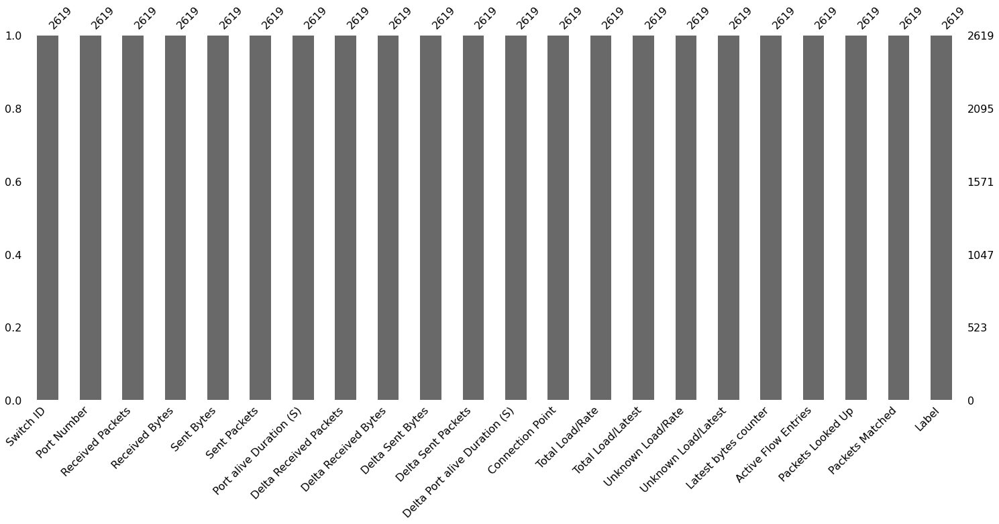

In [15]:
msno.bar(train)

##### Test Dataset

In [16]:
test.isna().sum()

Switch ID               0
Port Number             0
Received Packets        0
Received Bytes          0
Sent Bytes              0
                       ..
Latest bytes counter    0
Active Flow Entries     0
Packets Looked Up       0
Packets Matched         0
Label                   0
Length: 22, dtype: int64

In [17]:
show_missing_data(test)

,Total Number of missing observations,Percent,data_types
Switch ID,0,0.0,object
Port Number,0,0.0,object
Received Packets,0,0.0,int64
Received Bytes,0,0.0,int64
Sent Bytes,0,0.0,int64
...,...,...,...
Latest bytes counter,0,0.0,int64
Active Flow Entries,0,0.0,int64
Packets Looked Up,0,0.0,int64
Packets Matched,0,0.0,int64


<AxesSubplot:>

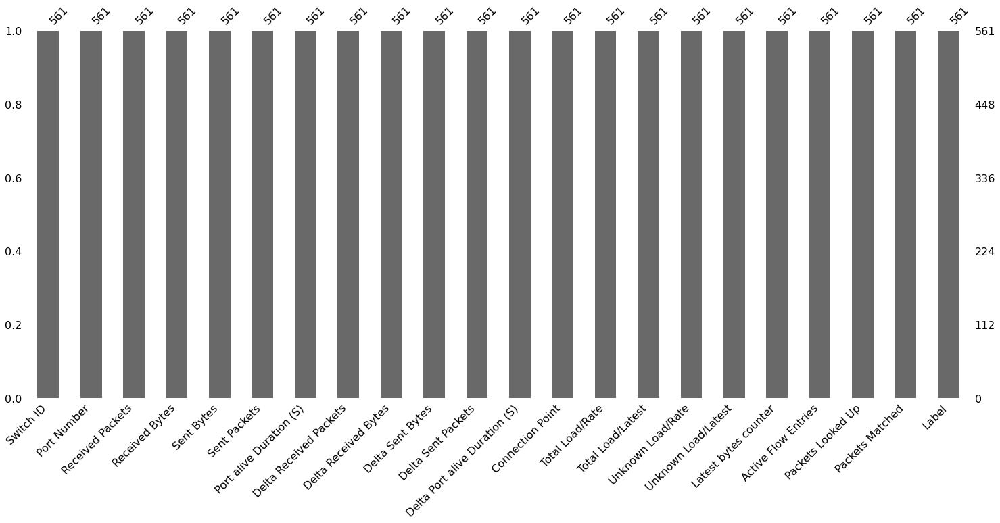

In [18]:
msno.bar(test)

##### Validation Dataset

In [19]:
val.isna().sum()

Switch ID               0
Port Number             0
Received Packets        0
Received Bytes          0
Sent Bytes              0
                       ..
Latest bytes counter    0
Active Flow Entries     0
Packets Looked Up       0
Packets Matched         0
Label                   0
Length: 22, dtype: int64

In [20]:
show_missing_data(val)

,Total Number of missing observations,Percent,data_types
Switch ID,0,0.0,object
Port Number,0,0.0,object
Received Packets,0,0.0,int64
Received Bytes,0,0.0,int64
Sent Bytes,0,0.0,int64
...,...,...,...
Latest bytes counter,0,0.0,int64
Active Flow Entries,0,0.0,int64
Packets Looked Up,0,0.0,int64
Packets Matched,0,0.0,int64


<AxesSubplot:>

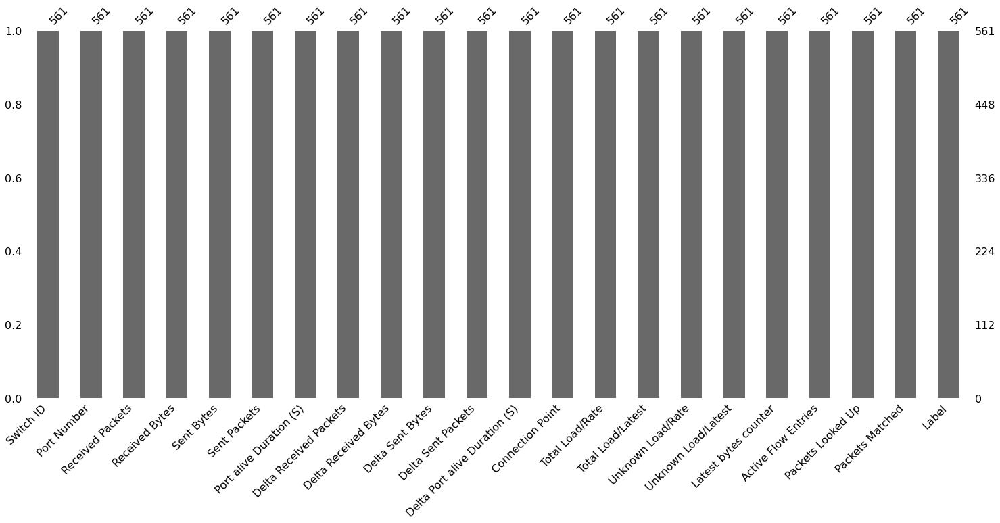

In [21]:
msno.bar(val)

#### Number of possible outliers 

In [22]:
#create a function to find outliers using IQR

def showing_outliers(df):

   qtr1=df.quantile(0.25)

   qtr3=df.quantile(0.75)

   IQR=qtr3-qtr1

   outliers = df[((df<(qtr1-1.5*IQR)) | (df>(qtr3+1.5*IQR)))].count()

   return outliers

##### Train Dataset

In [23]:
showing_outliers(train)

C:\Users\lap2\AppData\Local\Temp\ipykernel_11864\2698808288.py:11: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  outliers = df[((df<(qtr1-1.5*IQR)) | (df>(qtr3+1.5*IQR)))].count()


Switch ID                 0
Port Number               0
Received Packets        312
Received Bytes          186
Sent Bytes              222
                       ... 
Latest bytes counter    396
Active Flow Entries     152
Packets Looked Up       536
Packets Matched         536
Label                     0
Length: 22, dtype: int64

##### Test Dataset

In [24]:
showing_outliers(test)

C:\Users\lap2\AppData\Local\Temp\ipykernel_11864\2698808288.py:11: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  outliers = df[((df<(qtr1-1.5*IQR)) | (df>(qtr3+1.5*IQR)))].count()


Switch ID                 0
Port Number               0
Received Packets         69
Received Bytes           38
Sent Bytes               54
                       ... 
Latest bytes counter     76
Active Flow Entries      31
Packets Looked Up       108
Packets Matched         108
Label                     0
Length: 22, dtype: int64

##### Validation Dataset

In [25]:
showing_outliers(val)

C:\Users\lap2\AppData\Local\Temp\ipykernel_11864\2698808288.py:11: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  outliers = df[((df<(qtr1-1.5*IQR)) | (df>(qtr3+1.5*IQR)))].count()


Switch ID                 0
Port Number               0
Received Packets         73
Received Bytes           34
Sent Bytes               54
                       ... 
Latest bytes counter     60
Active Flow Entries      30
Packets Looked Up       116
Packets Matched         116
Label                     0
Length: 22, dtype: int64

#### statistical analysis 

##### Train Dataset

In [26]:
train.describe()

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Delta Received Packets,Delta Received Bytes,Delta Sent Bytes,Delta Sent Packets,Delta Port alive Duration (S),Connection Point,Total Load/Rate,Total Load/Latest,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Active Flow Entries,Packets Looked Up,Packets Matched
count,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0,2619.0
mean,19929.1,26066392.9,23726454.3,33676.6,890.5,174.9,325466.1,295717.1,160.6,4.8,2.5,20442.8,503308.7,20442.8,503308.7,20442.8,95.0,99204.6,99084.5
std,61817.9,36708011.3,33099080.0,90565.2,970.9,1028.9,1166623.9,1107859.2,972.5,0.4,1.2,114101.3,1796231.1,114101.3,1796231.1,114101.3,828.2,236317.5,236316.2
min,10.0,856.0,6025.0,44.0,26.0,0.0,0.0,278.0,2.0,4.0,1.0,-644624.0,0.0,-644624.0,0.0,-644624.0,4.0,105.0,50.0
25%,321.5,84649.0,53609.0,333.5,136.0,2.0,278.0,280.0,2.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,2263.0,2147.0
50%,1108.0,12620834.0,12621758.0,1243.0,254.0,4.0,556.0,556.0,4.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,6.0,6968.0,6843.0
75%,3268.5,37367852.5,31702186.5,3727.0,1721.0,6.0,831.0,759.0,5.0,5.0,3.0,0.0,0.0,0.0,0.0,0.0,8.0,21633.0,21408.0
max,352584.0,258942192.0,213072768.0,420806.0,3317.0,15588.0,6171714.0,6302910.0,15593.0,5.0,5.0,1260657.0,12753863.0,1260657.0,12753863.0,1260657.0,9985.0,1012220.0,1012085.0


##### Test Dataset

In [27]:
test.describe()

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Delta Received Packets,Delta Received Bytes,Delta Sent Bytes,Delta Sent Packets,Delta Port alive Duration (S),Connection Point,Total Load/Rate,Total Load/Latest,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Active Flow Entries,Packets Looked Up,Packets Matched
count,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0
mean,23141.6,27266773.4,24380932.0,30156.0,910.7,149.0,454666.0,317112.0,169.8,4.8,2.4,19920.6,608492.4,19920.6,608492.4,19920.6,61.9,90533.1,90413.5
std,69278.6,36278268.9,34390836.8,82370.3,981.3,861.3,1381150.8,1207562.5,1030.5,0.4,1.2,110511.2,1985466.8,110511.2,1985466.8,110511.2,601.5,223533.8,223532.4
min,10.0,856.0,6854.0,49.0,26.0,0.0,0.0,278.0,2.0,4.0,1.0,-404208.0,0.0,-404208.0,0.0,-404208.0,4.0,179.0,98.0
25%,353.0,104201.0,44801.0,322.0,136.0,2.0,278.0,280.0,2.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,2346.0,2238.0
50%,1376.0,12670230.0,12622994.0,1215.0,256.0,4.0,556.0,556.0,4.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,6.0,7066.0,6929.0
75%,3562.0,38094693.0,31767832.0,4054.0,1742.0,19.0,1823.0,759.0,5.0,5.0,3.0,0.0,0.0,0.0,0.0,0.0,8.0,19633.0,19409.0
max,352572.0,258939370.0,213874300.0,420932.0,3307.0,11130.0,6323770.0,6647966.0,13840.0,5.0,5.0,1194922.0,12646368.0,1194922.0,12646368.0,1194922.0,9980.0,1009529.0,1009394.0


##### Validation Dataset

In [28]:
val.describe()

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Delta Received Packets,Delta Received Bytes,Delta Sent Bytes,Delta Sent Packets,Delta Port alive Duration (S),Connection Point,Total Load/Rate,Total Load/Latest,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Active Flow Entries,Packets Looked Up,Packets Matched
count,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0,561.0
mean,20265.9,26510516.1,24620730.8,26309.1,949.4,238.8,326813.7,292778.1,162.7,4.8,2.4,13493.9,441870.8,13493.9,441870.8,13493.9,62.1,83829.2,83708.0
std,59032.9,35057146.5,34202253.6,75202.0,977.6,1149.1,1181635.8,1106076.6,909.9,0.4,1.2,91247.3,1725487.6,91247.3,1725487.6,91247.3,602.0,205635.7,205637.1
min,10.0,856.0,7202.0,50.0,36.0,0.0,0.0,278.0,2.0,4.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,140.0,84.0
25%,379.0,1962210.0,48568.0,377.0,141.0,2.0,278.0,280.0,2.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,2462.0,2350.0
50%,1385.0,12663952.0,12630284.0,1239.0,317.0,4.0,556.0,556.0,4.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,6.0,8105.0,7979.0
75%,3642.0,37857622.0,31763129.0,3889.0,1750.0,5.0,626.0,759.0,5.0,5.0,3.0,0.0,0.0,0.0,0.0,0.0,8.0,20735.0,20607.0
max,350280.0,265256792.0,183743482.0,419567.0,3287.0,11273.0,6249706.0,6302708.0,11273.0,5.0,5.0,1260664.0,12732102.0,1260664.0,12732102.0,1260664.0,9979.0,1009010.0,1008875.0


#### Number of dublicated values per feature

##### Train Dataset

In [29]:
train.duplicated().sum()

0

##### Test Dataset

In [30]:
test.duplicated().sum()

0

##### Validation Dataset

In [31]:
val.duplicated().sum()

0

#### coorelation between columns

##### training dataset

In [32]:
train.corr()

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Delta Received Packets,Delta Received Bytes,Delta Sent Bytes,Delta Sent Packets,Delta Port alive Duration (S),Connection Point,Total Load/Rate,Total Load/Latest,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Active Flow Entries,Packets Looked Up,Packets Matched
Received Packets,1.0,0.3,0.3,0.6,0.2,0.2,0.0,-0.0,0.1,-0.0,0.1,0.0,0.0,0.0,0.0,0.0,-0.0,0.7,0.7
Received Bytes,0.3,1.0,0.7,0.4,0.8,-0.0,0.1,0.0,-0.1,-0.0,0.1,0.0,0.0,0.0,0.0,0.0,-0.0,0.4,0.4
Sent Bytes,0.3,0.7,1.0,0.5,0.7,-0.1,-0.0,0.1,-0.0,-0.0,0.0,0.0,0.1,0.0,0.1,0.0,-0.0,0.4,0.4
Sent Packets,0.6,0.4,0.5,1.0,0.3,0.0,0.0,0.0,0.1,-0.1,-0.0,0.0,0.0,0.0,0.0,0.0,-0.0,0.9,0.9
Port alive Duration (S),0.2,0.8,0.7,0.3,1.0,-0.1,0.0,0.0,-0.1,0.0,0.2,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.3,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Unknown Load/Latest,0.0,0.0,0.1,0.0,-0.0,-0.0,-0.0,0.2,-0.0,-0.0,0.0,0.7,1.0,0.7,1.0,0.7,-0.0,0.0,0.0
Latest bytes counter,0.0,0.0,0.0,0.0,0.0,-0.0,0.0,0.3,-0.0,0.0,-0.0,1.0,0.7,1.0,0.7,1.0,-0.0,0.0,0.0
Active Flow Entries,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,1.0,-0.0,-0.0
Packets Looked Up,0.7,0.4,0.4,0.9,0.3,0.1,0.0,0.0,0.1,-0.1,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,1.0,1.0


##### test dataset

In [33]:
test.corr()

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Delta Received Packets,Delta Received Bytes,Delta Sent Bytes,Delta Sent Packets,Delta Port alive Duration (S),Connection Point,Total Load/Rate,Total Load/Latest,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Active Flow Entries,Packets Looked Up,Packets Matched
Received Packets,1.0,0.2,0.2,0.7,0.1,0.2,0.0,0.0,0.1,-0.1,0.1,0.1,0.1,0.1,0.1,0.1,-0.0,0.8,0.8
Received Bytes,0.2,1.0,0.7,0.4,0.7,-0.0,0.1,0.1,-0.0,0.0,0.1,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.4,0.4
Sent Bytes,0.2,0.7,1.0,0.5,0.8,-0.1,-0.0,0.1,-0.0,-0.0,0.0,0.1,0.0,0.1,0.0,0.1,-0.0,0.4,0.4
Sent Packets,0.7,0.4,0.5,1.0,0.3,0.1,-0.0,0.1,0.1,-0.1,-0.1,0.2,0.1,0.2,0.1,0.2,-0.0,0.9,0.9
Port alive Duration (S),0.1,0.7,0.8,0.3,1.0,-0.1,0.0,0.1,-0.1,0.1,0.2,0.0,-0.1,0.0,-0.1,0.0,-0.0,0.3,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Unknown Load/Latest,0.1,-0.0,0.0,0.1,-0.1,-0.0,0.0,0.1,-0.0,-0.0,0.0,0.6,1.0,0.6,1.0,0.6,-0.0,0.1,0.1
Latest bytes counter,0.1,0.0,0.1,0.2,0.0,-0.0,0.0,0.3,-0.0,-0.0,0.0,1.0,0.6,1.0,0.6,1.0,-0.0,0.2,0.2
Active Flow Entries,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,1.0,-0.0,-0.0
Packets Looked Up,0.8,0.4,0.4,0.9,0.3,0.1,0.0,0.1,0.1,-0.1,-0.0,0.2,0.1,0.2,0.1,0.2,-0.0,1.0,1.0


##### validation dataset 

In [34]:
val.corr()

,Received Packets,Received Bytes,Sent Bytes,Sent Packets,Port alive Duration (S),Delta Received Packets,Delta Received Bytes,Delta Sent Bytes,Delta Sent Packets,Delta Port alive Duration (S),Connection Point,Total Load/Rate,Total Load/Latest,Unknown Load/Rate,Unknown Load/Latest,Latest bytes counter,Active Flow Entries,Packets Looked Up,Packets Matched
Received Packets,1.0,0.1,0.2,0.5,0.1,0.3,0.0,0.0,0.1,-0.0,0.1,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.7,0.7
Received Bytes,0.1,1.0,0.7,0.3,0.7,-0.0,0.1,-0.0,-0.0,-0.0,0.1,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.3,0.3
Sent Bytes,0.2,0.7,1.0,0.4,0.8,-0.1,-0.0,0.0,-0.0,-0.0,0.1,0.1,0.0,0.1,0.0,0.1,-0.0,0.4,0.4
Sent Packets,0.5,0.3,0.4,1.0,0.2,0.0,0.0,0.0,0.2,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.9,0.9
Port alive Duration (S),0.1,0.7,0.8,0.2,1.0,-0.2,0.0,-0.0,-0.1,-0.0,0.2,0.0,0.0,0.0,0.0,0.0,-0.0,0.2,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Unknown Load/Latest,-0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,0.2,-0.0,-0.1,0.1,0.6,1.0,0.6,1.0,0.6,-0.0,-0.0,-0.0
Latest bytes counter,0.0,0.0,0.1,0.0,0.0,-0.0,-0.0,0.3,-0.0,-0.0,0.0,1.0,0.6,1.0,0.6,1.0,-0.0,0.0,0.0
Active Flow Entries,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.1,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,1.0,-0.0,-0.0
Packets Looked Up,0.7,0.3,0.4,0.9,0.2,0.1,0.0,0.0,0.1,-0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,1.0,1.0


# convert the data into numeric

In [35]:
#Convert Port Number and Switch ID and Label using Label Encoder
port_number_encoder = LabelEncoder()
switchid_encoder= LabelEncoder()
label_encoder = LabelEncoder()

#train
train['Port Number'] = port_number_encoder.fit_transform(train['Port Number'])
train['Switch ID'] = switchid_encoder.fit_transform(train['Switch ID'])
train['Label'] = label_encoder.fit_transform(train['Label'])

#Validation
val['Port Number'] = port_number_encoder.transform(val['Port Number'])
val['Switch ID'] = switchid_encoder.transform(val['Switch ID'])
val['Label'] = label_encoder.transform(val['Label'])

#Test
test['Port Number'] = port_number_encoder.transform(test['Port Number'])
test['Switch ID'] = switchid_encoder.transform(test['Switch ID'])
test['Label'] = label_encoder.transform(test['Label'])





# scaling the dataset 

In [36]:
#Using standard scalar to change the ranges of the dataset
standard_scalar = StandardScaler()

#train
train.iloc[:,:-1] = standard_scalar.fit_transform(train.iloc[:,:-1])
train

#test
test.iloc[:,:-1] = standard_scalar.transform(test.iloc[:,:-1])

#validation
val.iloc[:,:-1] = standard_scalar.transform(val.iloc[:,:-1])


#splitting the dataset

In [37]:
#Function splitting the data  
def x_y_split(df):
  x=df.iloc[:,:-1]
  y=df.iloc[:,-1]
  return x,y

In [38]:
#split traind and test 
x_train,y_train=x_y_split(train)
x_test,y_test=x_y_split(test)
x_val,y_val=x_y_split(val)




#### Density plots of the features
#### We represent with different colors the distribution for values with target value 0 and 1 and 2,3,4,5


Density plots of the features
We represent with different colors the distribution for values with target value 0 and 1 and 2,3,4,5

In [39]:
def plot_feature_distribution(df1, df2,df3,df4,df5,df6,label1, label2,label3,label4,label5,label6, features):
    """
    Plot feature distributions.
    """
    i = 0
    sns.set_style('whitegrid')
    plt.figure()
    fig, express = plt.subplots(4,4,figsize=(20,25))

    for feature in features:
        i += 1
        plt.subplot(6,6,i)
        sns.distplot(df1[feature], hist=False,label=label1)
        sns.distplot(df2[feature], hist=False,label=label2)
        sns.distplot(df3[feature], hist=False,label=label3)
        sns.distplot(df4[feature], hist=False,label=label4)
        sns.distplot(df5[feature], hist=False,label=label5)
        sns.distplot(df6[feature], hist=False,label=label6)
        plt.xlabel(feature, fontsize=5)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=4, pad=-4)
        plt.tick_params(axis='y', which='major', labelsize=4)
    plt.show();

C:\Users\lap2\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\lap2\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\lap2\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot

<Figure size 792x504 with 0 Axes>

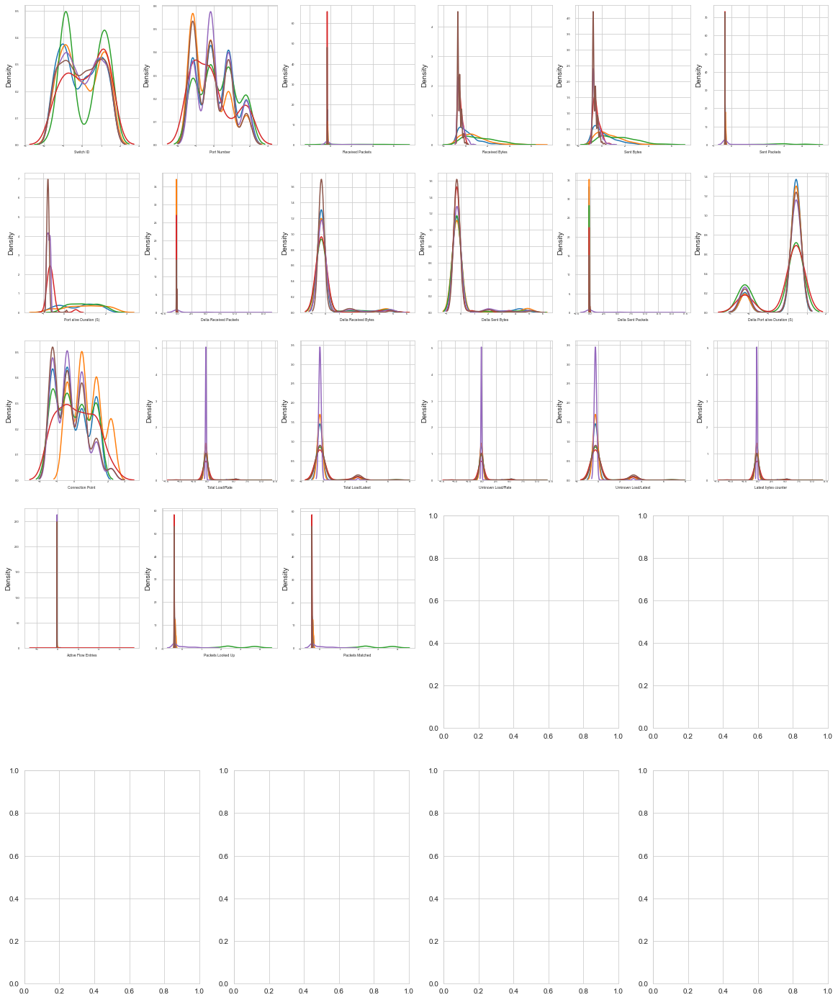

In [40]:
t0 = train.loc[train['Label'] == 0]
t1 = train.loc[train['Label'] == 1]
t2 = train.loc[train['Label'] == 2]
t3 = train.loc[train['Label'] == 3]
t4 = train.loc[train['Label'] == 4]
t5 = train.loc[train['Label'] == 5]
features = train.iloc[:,:-1]
plot_feature_distribution(t0, t1,t2, t3,t4, t5, '0', '1', '2', '3', '4', '5', features)

In [41]:
def plot_distribution_for_metrics(train, features, func, labels: list, titles: list,
                                  figsize=(20, 5), kde=True, bins=120, norm_hist=True):
    """
    
    """
    fig, ax = plt.subplots(1, 2, figsize=figsize)
    sns.distplot(train[features].apply(func, axis=1), ax=ax[0], color="red", 
                 kde=kde, bins=bins, norm_hist=norm_hist, label=labels[0])
    sns.distplot(train[features].apply(func, axis=0), ax=ax[1], color="blue", 
                 kde=kde, bins=bins, norm_hist=norm_hist, label=labels[1])
    
    ax[0].set_title(titles[0])
    ax[1].set_title(titles[1])

    ax[0].legend()
    ax[1].legend()
    plt.show()

In [42]:
# select features to use
#train.columns.values[:train.columns != 'Label']
#features = train.loc[:, train.columns != 'Label']
features=x_train.columns.values[:]
labels = ['train_row', 'train_column']

C:\Users\lap2\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\lap2\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


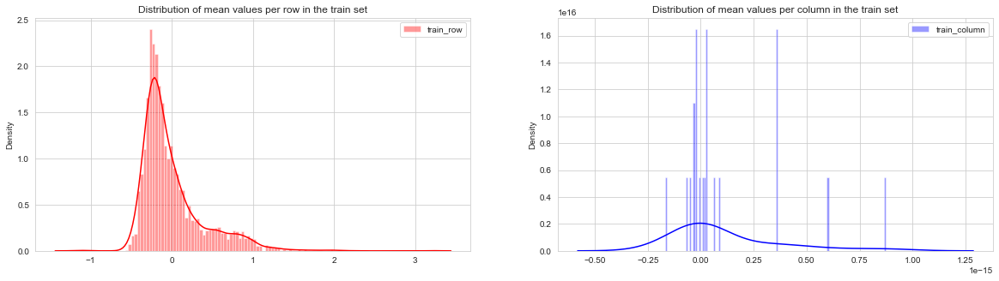

In [43]:
# plot the distribution of mean values per row and per column
titles = ["Distribution of mean values per row in the train set",
         "Distribution of mean values per column in the train set"]

plot_distribution_for_metrics(train, features, 'mean', labels=labels, titles=titles)

C:\Users\lap2\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\lap2\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


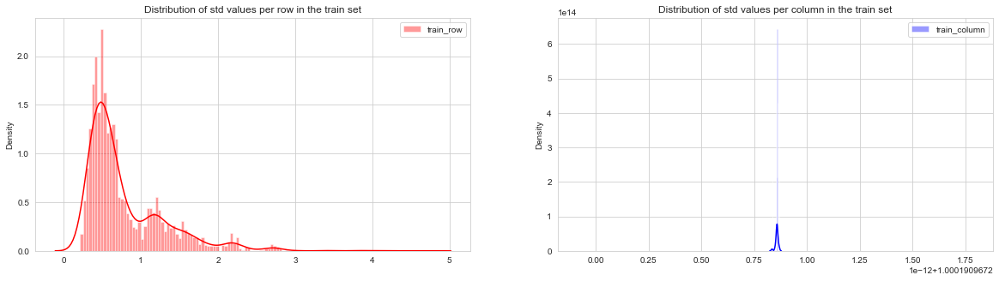

In [44]:
titles = ["Distribution of std values per row in the train set",
         "Distribution of std values per column in the train set"]

plot_distribution_for_metrics(train, features, 'std', labels=labels, titles=titles)

# Q1:Obtain a baseline performance

#### Helper function

In [45]:
def plot_confusion_matrix(data, labels):
    sns.set(color_codes=True)
    plt.figure(1, figsize=(9, 6))
 
    plt.title("Confusion Matrix")
    sns.set(font_scale=1.6)
    
    ax = sns.heatmap(data, annot=True,fmt='g')
 
    ax.set_xticklabels(labels)
    ax.set_yticklabels(labels)
    ax.set(ylabel="True Label", xlabel="Predicted Label")
    plt.show()

def get_average_confusion(confusion) :
    cm_cocat=pd.concat((pd.DataFrame(confusion[0]),pd.DataFrame(confusion[1]),pd.DataFrame(confusion[2]),pd.DataFrame(confusion[3]),pd.DataFrame(confusion[4])))
    confusion_avg=cm_cocat.groupby(cm_cocat.index)
    confusion_avg.mean()
    confusion_avg=round(confusion_avg.mean())
    return confusion_avg    

def get_all_accuraccy(total_history_train,total_history_val,accuraccy_total):
    # Training acccuraccy
    maximum_train_accuracy = np.amax(total_history_train)
    minimum_train_accuracy = np.amin(total_history_train)
    avgerage_train_accuracy = np.average(total_history_train)

    # Testing accuraccy 
    maximum_test_accuracy =  np.amax(accuraccy_total)
    minimum_test_accuracy =  np.amin(accuraccy_total)
    avgerage_test_accuracy =  np.average(accuraccy_total)

    # Valadation accuraccy 
    maximum_Valadation_accuracy =  np.amax(total_history_val)
    minimum_Valadation_accuracy =  np.amin(total_history_val)
    avgerage_Valadation_accuracy =  np.average(total_history_val)
    print('Min, Max, Avg Accuracies', '\n')
    print('Maximum_train_accuracy:\t',maximum_train_accuracy)
    print('Minimum_train_accuracy:\t',minimum_train_accuracy)
    print('Avgerage_train_accuracy:\t',avgerage_train_accuracy)
    print('\n')
    print('maximum_test_accuracy:\t',maximum_test_accuracy)
    print('Min_testing_accuracy:\t',minimum_test_accuracy)
    print('Avg_testing_accuracy:\t',avgerage_test_accuracy)
    print('\n')
    print('maximum_Vala_accuracy:\t ',maximum_Valadation_accuracy)
    print('minimum_Vala_accuracy:\t',minimum_Valadation_accuracy)
    print('avgerage_Vala_accuracy:\t',avgerage_Valadation_accuracy)
    print('\n')
    return avgerage_test_accuracy
    

def plot_tsne(X, y,title):
    tsne = TSNE(n_components=2, random_state=0)
    x_tsne = tsne.fit_transform(X)
    plt.figure(figsize=(17,6))
    plt.subplot(1,2,1)
    for i in range(0,5):
        plt.scatter(x_tsne[y == i, 0], x_tsne[y == i, 1],label=str(i+1))
    plt.title(title)
    plt.xlabel("TSNE Component 1")
    plt.ylabel("TSNE Component 2")
    plt.legend()
    


#### Model Building

In [46]:
import tensorflow.keras as keras
from tensorflow.keras.layers import Dense
import keras
from keras.layers import Input, Dense, Flatten
from keras.models import Model
from sklearn.metrics import confusion_matrix
import numpy as np


In [47]:
x_train.shape


(2619, 21)

Epoch 1/500
2619/2619 [==============================] - 2s 584us/step - loss: 1.2111 - accuracy: 0.5277 - val_loss: 0.8540 - val_accuracy: 0.6702
Epoch 2/500
2619/2619 [==============================] - 1s 551us/step - loss: 0.8106 - accuracy: 0.6739 - val_loss: 0.7710 - val_accuracy: 0.6275
Epoch 3/500
2619/2619 [==============================] - 1s 558us/step - loss: 0.7447 - accuracy: 0.6949 - val_loss: 0.7062 - val_accuracy: 0.7326
Epoch 4/500
2619/2619 [==============================] - 1s 552us/step - loss: 0.7207 - accuracy: 0.7033 - val_loss: 0.7009 - val_accuracy: 0.7077
Epoch 5/500
2619/2619 [==============================] - 1s 554us/step - loss: 0.7110 - accuracy: 0.7094 - val_loss: 0.6916 - val_accuracy: 0.7112
Epoch 6/500
2619/2619 [==============================] - 1s 553us/step - loss: 0.7037 - accuracy: 0.7125 - val_loss: 0.6842 - val_accuracy: 0.7201
Epoch 7/500
2619/2619 [==============================] - 1s 558us/step - loss: 0.6987 - accuracy: 0.7171 - val_loss: 0

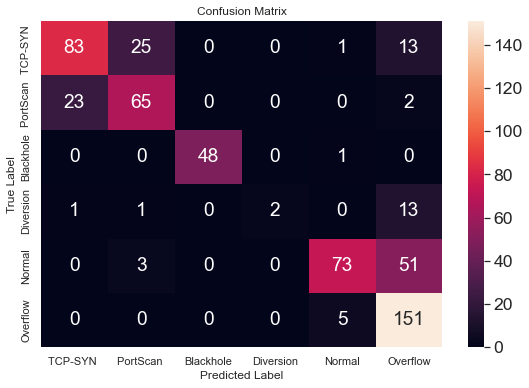

Epoch 1/500
2619/2619 [==============================] - 4s 639us/step - loss: 1.2328 - accuracy: 0.5059 - val_loss: 0.8845 - val_accuracy: 0.6613
Epoch 2/500
2619/2619 [==============================] - 1s 549us/step - loss: 0.8191 - accuracy: 0.6632 - val_loss: 0.7653 - val_accuracy: 0.7184
Epoch 3/500
2619/2619 [==============================] - 1s 548us/step - loss: 0.7479 - accuracy: 0.6934 - val_loss: 0.7316 - val_accuracy: 0.7005
Epoch 4/500
2619/2619 [==============================] - 1s 554us/step - loss: 0.7279 - accuracy: 0.7022 - val_loss: 0.7089 - val_accuracy: 0.7362
Epoch 5/500
2619/2619 [==============================] - 1s 552us/step - loss: 0.7165 - accuracy: 0.7071 - val_loss: 0.7111 - val_accuracy: 0.7415
Epoch 6/500
2619/2619 [==============================] - 1s 548us/step - loss: 0.7050 - accuracy: 0.7148 - val_loss: 0.6940 - val_accuracy: 0.7398
Epoch 7/500
2619/2619 [==============================] - 1s 551us/step - loss: 0.7037 - accuracy: 0.7243 - val_loss: 0

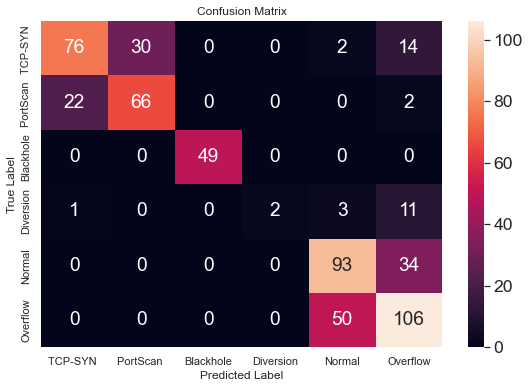

Epoch 1/500
2619/2619 [==============================] - 4s 812us/step - loss: 1.2026 - accuracy: 0.5174 - val_loss: 0.8679 - val_accuracy: 0.6595
Epoch 2/500
2619/2619 [==============================] - 1s 565us/step - loss: 0.8213 - accuracy: 0.6617 - val_loss: 0.7558 - val_accuracy: 0.6774
Epoch 3/500
2619/2619 [==============================] - 1s 550us/step - loss: 0.7492 - accuracy: 0.6877 - val_loss: 0.7196 - val_accuracy: 0.7184
Epoch 4/500
2619/2619 [==============================] - 1s 562us/step - loss: 0.7248 - accuracy: 0.7006 - val_loss: 0.6982 - val_accuracy: 0.7237
Epoch 5/500
2619/2619 [==============================] - 1s 562us/step - loss: 0.7089 - accuracy: 0.7098 - val_loss: 0.6885 - val_accuracy: 0.7237
Epoch 6/500
2619/2619 [==============================] - 1s 559us/step - loss: 0.7024 - accuracy: 0.7136 - val_loss: 0.6876 - val_accuracy: 0.7308
Epoch 7/500
2619/2619 [==============================] - 1s 562us/step - loss: 0.7006 - accuracy: 0.7159 - val_loss: 0

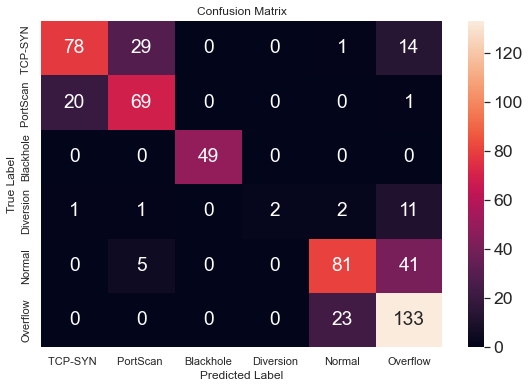

Epoch 1/500
2619/2619 [==============================] - 7s 687us/step - loss: 1.2253 - accuracy: 0.4941 - val_loss: 0.8846 - val_accuracy: 0.5847
Epoch 2/500
2619/2619 [==============================] - 1s 563us/step - loss: 0.8255 - accuracy: 0.6522 - val_loss: 0.7499 - val_accuracy: 0.7130
Epoch 3/500
2619/2619 [==============================] - 1s 567us/step - loss: 0.7502 - accuracy: 0.6938 - val_loss: 0.7185 - val_accuracy: 0.6791
Epoch 4/500
2619/2619 [==============================] - 1s 558us/step - loss: 0.7235 - accuracy: 0.7026 - val_loss: 0.7052 - val_accuracy: 0.7362
Epoch 5/500
2619/2619 [==============================] - 2s 569us/step - loss: 0.7134 - accuracy: 0.7060 - val_loss: 0.6881 - val_accuracy: 0.7291
Epoch 6/500
2619/2619 [==============================] - 1s 550us/step - loss: 0.7095 - accuracy: 0.6991 - val_loss: 0.6826 - val_accuracy: 0.7291
Epoch 7/500
2619/2619 [==============================] - 1s 549us/step - loss: 0.6992 - accuracy: 0.7110 - val_loss: 0

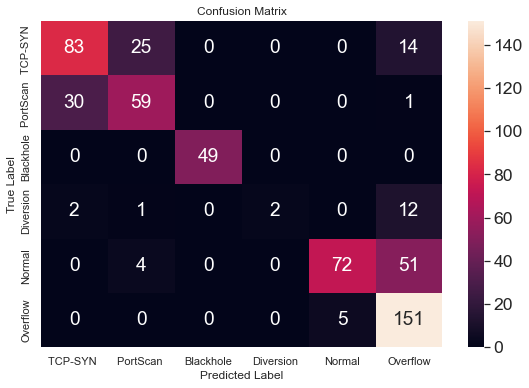

Epoch 1/500
2619/2619 [==============================] - 2s 601us/step - loss: 1.1105 - accuracy: 0.5452 - val_loss: 0.8721 - val_accuracy: 0.6560
Epoch 2/500
2619/2619 [==============================] - 1s 565us/step - loss: 0.8219 - accuracy: 0.6480 - val_loss: 0.7816 - val_accuracy: 0.7005
Epoch 3/500
2619/2619 [==============================] - 1s 554us/step - loss: 0.7675 - accuracy: 0.6823 - val_loss: 0.7502 - val_accuracy: 0.7237
Epoch 4/500
2619/2619 [==============================] - 1s 555us/step - loss: 0.7415 - accuracy: 0.7079 - val_loss: 0.7278 - val_accuracy: 0.7219
Epoch 5/500
2619/2619 [==============================] - 2s 582us/step - loss: 0.7253 - accuracy: 0.7083 - val_loss: 0.7176 - val_accuracy: 0.6988
Epoch 6/500
2619/2619 [==============================] - 1s 555us/step - loss: 0.7162 - accuracy: 0.7003 - val_loss: 0.7039 - val_accuracy: 0.7219
Epoch 7/500
2619/2619 [==============================] - 1s 557us/step - loss: 0.7097 - accuracy: 0.7064 - val_loss: 0

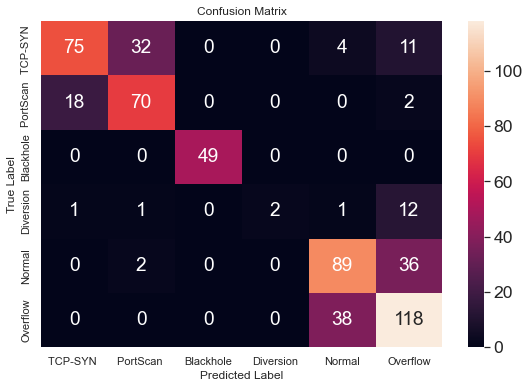

In [49]:
total_history_train= []
total_history_val= []
loss_train=[]
loss_test=[]
accuraccy_total=[]
confusion=[]
number_of_runs=5
#model = tf.keras.models.Sequential()
for i in range(number_of_runs):
  optimizer = tfa.optimizers.AdamW(learning_rate = 0.001,weight_decay = 0.0001)
  model = tf.keras.models.Sequential()
  model.add(tf.keras.layers.Dense(10, input_shape = (21,), activation = 'relu'))
  model.add(tf.keras.layers.Dense(6, activation = "softmax"))
  model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics = ["accuracy"])
  model.fit(x_train, y_train, epochs=500, batch_size=1, validation_data=(x_test, y_test))
  model.history.history
  total_history_train.append(model.history.history['accuracy'])
  total_history_val.append(model.history.history['val_accuracy'])
  loss_train.append(model.history.history['loss'])
  loss_test.append(model.history.history['val_loss'])
  accuraccy_total.append(model.evaluate(x_test,y_test, verbose=0)[1])
  y_pred = np.argmax(model.predict(x_test), axis=1)
  data= confusion_matrix(y_test, y_pred)
  confusion.append(data)
  labels =['TCP-SYN ','PortScan ','Blackhole','Diversion','Normal','Overflow']
  plot_confusion_matrix(data,labels)
  

#### Plotting the average of Confusion matrix 

In [50]:
avg_confusion=get_average_confusion(confusion)


In [51]:
avg_confusion

,0,1,2,3,4,5
0,79.0,28.0,0.0,0.0,2.0,13.0
1,23.0,66.0,0.0,0.0,0.0,2.0
2,0.0,0.0,49.0,0.0,0.0,0.0
3,1.0,1.0,0.0,2.0,1.0,12.0
4,0.0,3.0,0.0,0.0,82.0,43.0
5,0.0,0.0,0.0,0.0,24.0,132.0


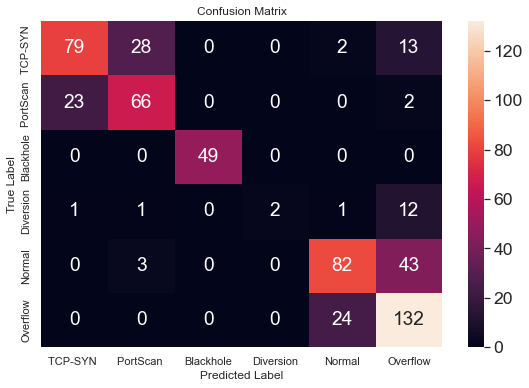

In [53]:
plot_confusion_matrix(np.array(avg_confusion),labels)

#### Number of runs vs. train and validation accuray

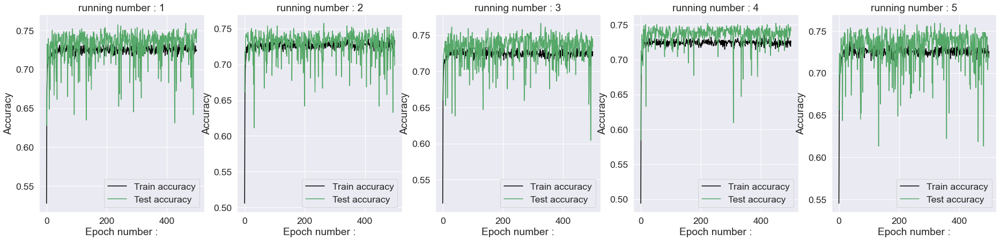

In [54]:
for i in range(number_of_runs):
  f=plt.subplot(2,5,i+1)
  f.figure.set_size_inches(32,15)
  plt.plot(total_history_train[i],'black')
  plt.plot(total_history_val[i],'g')
  plt.legend(['Train accuracy', 'Test accuracy']) 
  plt.title("running number : %d"%(i+1))
  plt.xlabel("Epoch number :")
  plt.ylabel("Accuracy")
  plt.grid('auto') 



In [55]:
loss_train[i]

[1.1104774475097656,
 0.8219326734542847,
 0.7675177454948425,
 0.7414833307266235,
 0.7253229022026062,
 0.7162284255027771,
 0.7096878290176392,
 0.705601155757904,
 0.7016012668609619,
 0.6961920261383057,
 0.6950153708457947,
 0.6920793652534485,
 0.6922289729118347,
 0.6910940408706665,
 0.6897646188735962,
 0.6891958117485046,
 0.689862847328186,
 0.6921926736831665,
 0.6894866824150085,
 0.6879863142967224,
 0.6879807710647583,
 0.6900373697280884,
 0.6892054080963135,
 0.6875253319740295,
 0.6847527623176575,
 0.6878434419631958,
 0.6875435709953308,
 0.6868117451667786,
 0.6855728626251221,
 0.686261773109436,
 0.6888054609298706,
 0.6864548921585083,
 0.6876108646392822,
 0.6844657063484192,
 0.6868938207626343,
 0.6858135461807251,
 0.6839481592178345,
 0.6857116222381592,
 0.6848892569541931,
 0.6868420243263245,
 0.686540424823761,
 0.6853988170623779,
 0.6877891421318054,
 0.6812331080436707,
 0.685575008392334,
 0.6862165927886963,
 0.6841065287590027,
 0.684873759746551

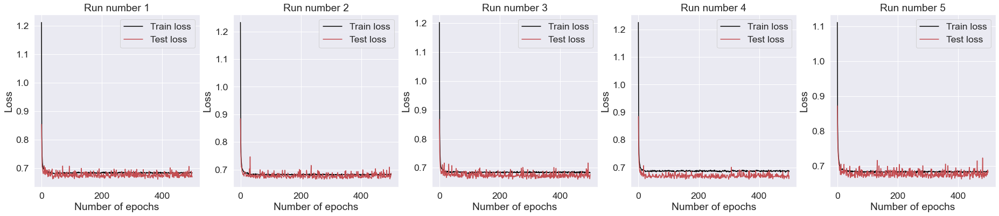

In [56]:
for i in range(number_of_runs):
  f=plt.subplot(2,5,i+1)
  f.figure.set_size_inches(32,13)
  plt.plot(loss_train[i],'black')
  plt.plot(loss_test[i],'r')
  plt.legend(['Train loss', 'Test loss']) 
  plt.title("Run number %d"%(i+1))
  plt.xlabel("Number of epochs")
  plt.ylabel("Loss")
  plt.grid('auto')


#### Training and Testing losses vs. the number of epochs

In [57]:
[test_loss,test_acccuracy] = model.evaluate(x_test,y_test)
print('test accuracy: ',test_acccuracy*100,'%')
print('test loss: ',test_loss)

18/18 [==============================] - 0s 947us/step - loss: 0.6814 - accuracy: 0.7184
test accuracy:  71.83600664138794 %
test loss:  0.6814202070236206


#### Getting all  Accuracies

In [58]:
base=get_all_accuraccy(total_history_train,total_history_val,accuraccy_total)

Min, Max, Avg Accuracies 

Maximum_train_accuracy:	 0.7384498119354248
Minimum_train_accuracy:	 0.4940817058086395
Avgerage_train_accuracy:	 0.7246883550286293


maximum_test_accuracy:	 0.7522281408309937
Min_testing_accuracy:	 0.698752224445343
Avg_testing_accuracy:	 0.7290552496910095


maximum_Vala_accuracy:	  0.7664884328842163
minimum_Vala_accuracy:	 0.5846702456474304
avgerage_Vala_accuracy:	 0.7314131907701492




In [59]:
base

0.7290552496910095

#### plotting TSNE 

 ##### Training set

C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


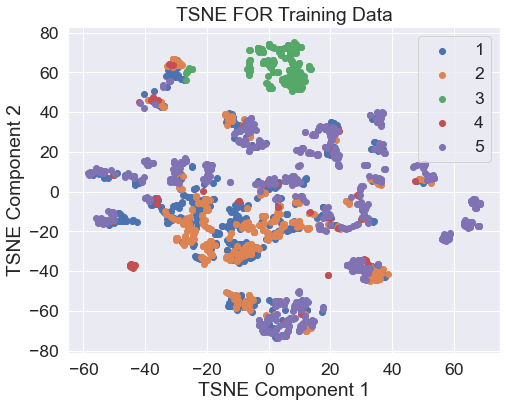

In [60]:
plot_tsne(x_train, y_train,"TSNE FOR Training Data")

##### Test set

C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


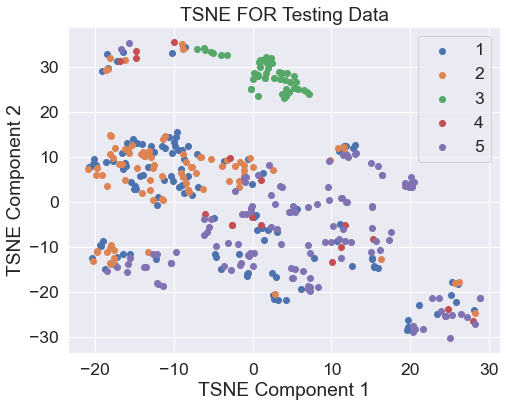

In [61]:
plot_tsne(x_test, y_test,"TSNE FOR Testing Data")

##### Validation

C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


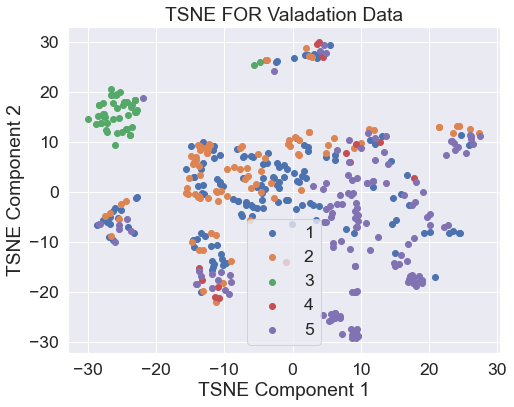

In [62]:
plot_tsne(x_val, y_val,"TSNE FOR Valadation Data")

# Questation 2

#dimension_reduction

In [63]:
x_train.shape[1]

21

In [64]:
#-----build_model------------
def build_model(no_epoch,batch_size,x_train,y_train,x_val,y_val):
  model = keras.Sequential()
  model.add(keras.layers.Dense(10, input_shape = (x_train.shape[1],),activation = 'relu'))
  model.add(keras.layers.Dense(6,activation = 'softmax'))

  optimizer = tfa.optimizers.AdamW(
      learning_rate = 0.001,
      weight_decay = 0.0001
  )

  model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics='accuracy')
  callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode = "min", restore_best_weights =True)

  results= model.fit(
    x=x_train,
    y=y_train,
    shuffle=True,
    epochs=no_epoch,
    validation_data = (x_val,y_val),
    batch_size=batch_size,
      callbacks = [callback]
  )
  return model,results
#-------pca---------------------------------
def pca_reduction(x_train,n=2):
  pca = PCA(n_components=n,random_state=0)
  pca_train=pca.fit_transform(x_train)
  return pca_train
#------evaluate_model------------------------
def evaluate_model(model,x_test,y_test):
  val_loss,val_acc=model.evaluate(x_test,y_test)
  return val_acc,val_loss




In [65]:
Pca_accuracy=[]
total_Pca_val=[]
for i in range(2,20):
  pca = PCA(n_components=i,random_state=0)
  pca_train=pca.fit_transform(x_train)
  pca_validation=pca.transform(x_val)
  pca_test=pca.transform(x_test)
  model,results=build_model(500,32,pca_train,y_train,pca_validation,y_val)
  total_Pca_val.append(np.amax(model.history.history['val_accuracy']))
  acc,loss=evaluate_model(model,pca_test,y_test)
  Pca_accuracy.append(acc)

Epoch 1/500
82/82 [==============================] - 0s 2ms/step - loss: 1.9636 - accuracy: 0.2348 - val_loss: 1.8061 - val_accuracy: 0.2424
Epoch 2/500
82/82 [==============================] - 0s 739us/step - loss: 1.7251 - accuracy: 0.2726 - val_loss: 1.6370 - val_accuracy: 0.2638
Epoch 3/500
82/82 [==============================] - 0s 739us/step - loss: 1.5694 - accuracy: 0.3253 - val_loss: 1.5267 - val_accuracy: 0.3458
Epoch 4/500
82/82 [==============================] - 0s 741us/step - loss: 1.4678 - accuracy: 0.3795 - val_loss: 1.4491 - val_accuracy: 0.3797
Epoch 5/500
82/82 [==============================] - 0s 744us/step - loss: 1.3953 - accuracy: 0.4009 - val_loss: 1.3927 - val_accuracy: 0.3779
Epoch 6/500
82/82 [==============================] - 0s 733us/step - loss: 1.3429 - accuracy: 0.4261 - val_loss: 1.3513 - val_accuracy: 0.3886
Epoch 7/500
82/82 [==============================] - 0s 746us/step - loss: 1.3038 - accuracy: 0.4441 - val_loss: 1.3163 - val_accuracy: 0.4207
E

In [66]:
np.argmax(Pca_accuracy)
print(f'the best pca  accuracy ={Pca_accuracy[np.argmax(Pca_accuracy)]}')
index = np.unravel_index(np.argmax(Pca_accuracy),shape=(20,1))
INN,_=index
print("best value for n_components based on the test accuracy is ",INN+2)

the best pca  accuracy =0.7736185193061829
best value for n_components based on the test accuracy is  19


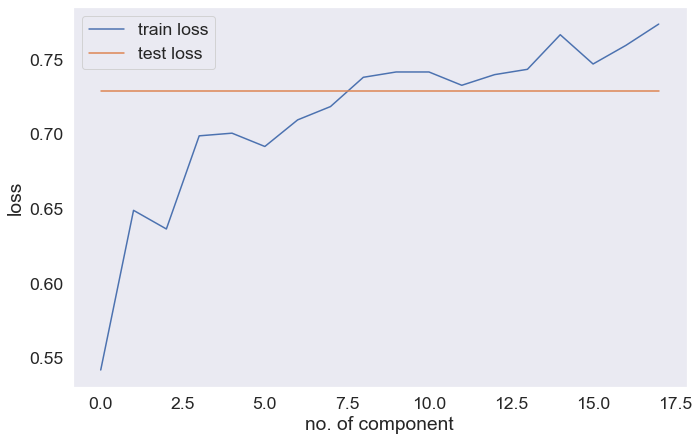

In [67]:
#plot Accuracy vs number of component
from matplotlib import figure
plt.plot(Pca_accuracy)
plt.plot([base]*len(Pca_accuracy))
plt.legend(['train loss', 'test loss']) 
plt.xlabel("no. of component")
plt.ylabel("loss")
plt.grid()


In [68]:
#-------T-SNE AFTER REDUCTION-------------
pca = PCA(n_components=INN+2,random_state=0)
pca_train=pca.fit_transform(x_train)
pca_test=pca.transform(x_test)

C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


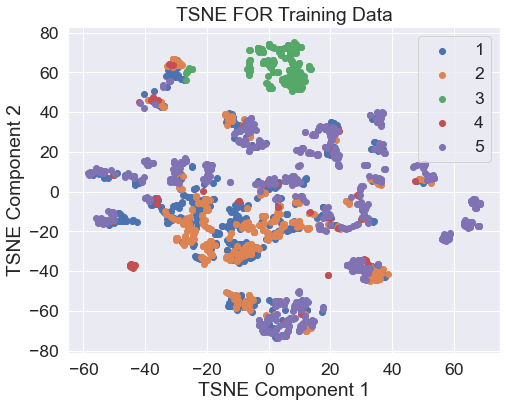

In [69]:
#----TSNE_TRAINING---------
plot_tsne(pca_train, y_train,"TSNE FOR Training Data")


C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


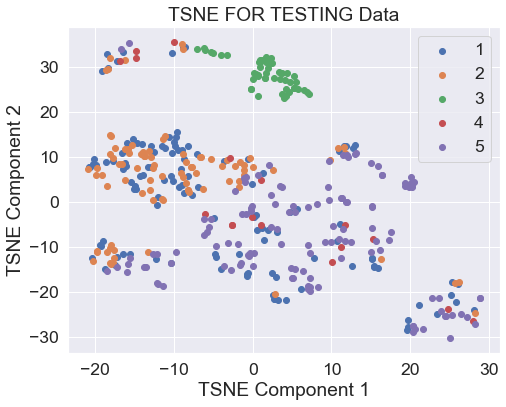

In [70]:
#----TSNE_Testing---------
plot_tsne(pca_test, y_test,"TSNE FOR TESTING Data")


Anova and mutual_information

In [71]:
def get_index(fun,string):
    
    np.argmax(fun)
    print('the best '+string+f' ={fun[np.argmax(fun)]}')
    index = np.unravel_index(np.argmax(fun),shape=(18,1))
    INN,_=index
    index_value=INN+2
    print("best value for n_components  ",index_value)
    return index_value

    

In [72]:
#-----mutual_information-----------

from sklearn.feature_selection import SelectKBest,mutual_info_classif
mutual_accuracy=[]
total_mutual_val=[]
for i in range(2,20):
  fsm=SelectKBest(mutual_info_classif,k=i)
  fsm_train=fsm.fit_transform(x_train,y_train)
  fsm_val=fsm.transform(x_val)
  fsm_test=fsm.transform(x_test)
  mlp_model,results=build_model(500,32,fsm_train,y_train,fsm_val,y_val)
  total_mutual_val.append(np.amax(mlp_model.history.history['val_accuracy']))
  acc,loss=evaluate_model(mlp_model,fsm_test,y_test)
  mutual_accuracy.append(acc)

Epoch 1/500
82/82 [==============================] - 0s 2ms/step - loss: 1.6765 - accuracy: 0.3715 - val_loss: 1.5963 - val_accuracy: 0.5027
Epoch 2/500
82/82 [==============================] - 0s 739us/step - loss: 1.4822 - accuracy: 0.5357 - val_loss: 1.4026 - val_accuracy: 0.5365
Epoch 3/500
82/82 [==============================] - 0s 712us/step - loss: 1.3024 - accuracy: 0.5578 - val_loss: 1.2264 - val_accuracy: 0.5758
Epoch 4/500
82/82 [==============================] - 0s 835us/step - loss: 1.1510 - accuracy: 0.5746 - val_loss: 1.0885 - val_accuracy: 0.6025
Epoch 5/500
82/82 [==============================] - 0s 763us/step - loss: 1.0429 - accuracy: 0.5998 - val_loss: 0.9974 - val_accuracy: 0.6310
Epoch 6/500
82/82 [==============================] - 0s 763us/step - loss: 0.9741 - accuracy: 0.6247 - val_loss: 0.9390 - val_accuracy: 0.6471
Epoch 7/500
82/82 [==============================] - 0s 751us/step - loss: 0.9289 - accuracy: 0.6396 - val_loss: 0.8994 - val_accuracy: 0.6542
E

In [73]:
#-----ANOVA-----------
Anova_accuracy=[]
total_annova_val=[]
for i in range(2,20):
  selector = SelectKBest(f_classif, k=i)
  annova_train=selector.fit_transform(x_train, y_train)
  annova_val=selector.fit_transform(x_val,y_val)
  annova_test=selector.transform(x_test)
  model,results=build_model(500,32,annova_train,y_train,annova_val,y_val)
  total_annova_val.append(np.amax(model.history.history['val_accuracy']))

  acc,loss=evaluate_model(model,annova_test,y_test)
  Anova_accuracy.append(acc)



Epoch 1/500
82/82 [==============================] - 0s 2ms/step - loss: 1.6767 - accuracy: 0.2806 - val_loss: 1.6138 - val_accuracy: 0.3565
Epoch 2/500
82/82 [==============================] - 0s 738us/step - loss: 1.5391 - accuracy: 0.3429 - val_loss: 1.5043 - val_accuracy: 0.4029
Epoch 3/500
82/82 [==============================] - 0s 685us/step - loss: 1.4456 - accuracy: 0.3807 - val_loss: 1.4290 - val_accuracy: 0.3904
Epoch 4/500
82/82 [==============================] - 0s 733us/step - loss: 1.3803 - accuracy: 0.4238 - val_loss: 1.3719 - val_accuracy: 0.4118
Epoch 5/500
82/82 [==============================] - 0s 758us/step - loss: 1.3359 - accuracy: 0.4368 - val_loss: 1.3348 - val_accuracy: 0.4225
Epoch 6/500
82/82 [==============================] - 0s 670us/step - loss: 1.3064 - accuracy: 0.4464 - val_loss: 1.3093 - val_accuracy: 0.4314
Epoch 7/500
82/82 [==============================] - 0s 744us/step - loss: 1.2851 - accuracy: 0.4521 - val_loss: 1.2900 - val_accuracy: 0.4349
E

In [74]:
mutual_val_index=get_index(total_mutual_val,'mutual index')

the best mutual index =0.77183598279953
best value for n_components   18


In [75]:
Annova_val_index=get_index(total_annova_val,'anvoa val index')

the best anvoa val index =0.7860962748527527
best value for n_components   9


In [76]:
mutual_acc_index=get_index(mutual_accuracy,'mutual acc')

the best mutual acc =0.7664884328842163
best value for n_components   19


In [77]:
Annova_acc_index=get_index(Anova_accuracy,'anvoa acc')

the best anvoa acc =0.7896613478660583
best value for n_components   11


In [78]:
Pca_val_index=get_index(total_Pca_val,'Pca index')

the best Pca index =0.782531201839447
best value for n_components   19


In [79]:
#compare Accuracy between Anova and Mutal Information
#testing the method that achieves the best test accuracy results 
Techniques = ['Mutal Information','Anova']
#Accuracy = [np.argmax(mutual_accuracy), np.argmax(Anova_accuracy)]
Accuracy=[mutual_accuracy[np.argmax(mutual_accuracy)],Anova_accuracy[ np.argmax(Anova_accuracy)],]
Accuracy


[0.7664884328842163, 0.7896613478660583]

In [80]:
express.bar(x = Techniques, y = Accuracy, color=Accuracy , title=" Anova VS  Mutal Information that achieves the best test accuracy results  ",labels={'x':'Techniques','y':'Accuracy'})

C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



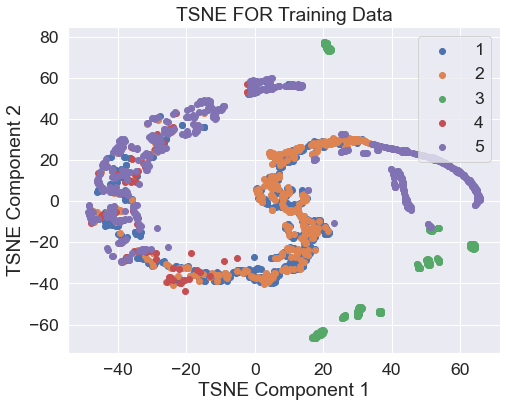

In [ ]:
#the best are Mutual information so we will plot tsne based on it 
fsm=SelectKBest(f_classif,k=Annova_acc_index)
fsm_train=fsm.fit_transform(x_train,y_train)
#----TSNE_TRAINING---------
plot_tsne(fsm_train, y_train,"TSNE FOR Training Data")

C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\lap2\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



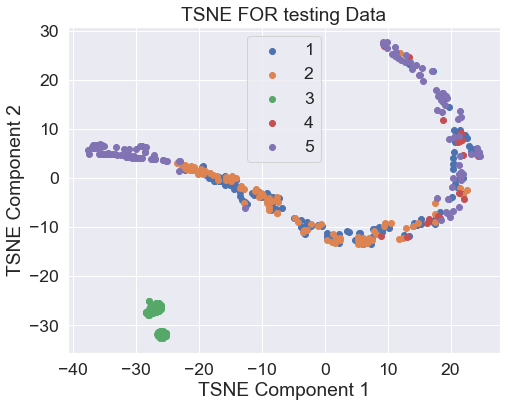

In [ ]:
fsm_test=fsm.fit_transform(x_test,y_test)
#----TSNE_TRAINING---------
plot_tsne(fsm_test, y_test,"TSNE FOR testing Data")

In [81]:
#compare Accuracy between Anova and Mutal Information 
Techniques = ['Mutal Information','Anova']
#Accuracy = [np.argmax(mutual_accuracy), np.argmax(Anova_accuracy)]
Accuracy=[total_mutual_val[np.argmax(total_mutual_val)],total_annova_val[ np.argmax(total_annova_val)],]
Accuracy


[0.77183598279953, 0.7860962748527527]

In [82]:
express.bar(x = Techniques, y = Accuracy, color=Accuracy , title="Comparision between Anova and Mutal Information in validation acc",labels={'x':'Techniques','y':'Accuracy'})

In [83]:
#compare Accuracy between Anova and Mutal Information 
Techniques = ['anova','PCA']
#Accuracy = [np.argmax(mutual_accuracy), np.argmax(Anova_accuracy)]
Accuracy=[total_annova_val[np.argmax(total_annova_val)],total_Pca_val[ np.argmax(total_Pca_val)],]
Accuracy


[0.7860962748527527, 0.782531201839447]

In [84]:
express.bar(x = Techniques, y = Accuracy, color=Accuracy , title="Comparision between Anova and Mutal Information in validation acc",labels={'x':'Techniques','y':'Accuracy'})

In [108]:
fsm=SelectKBest(f_classif,k=Annova_val_index)
n_x_train=fsm.fit_transform(x_train,y_train)


In [109]:
n_x_test=fsm.fit_transform(x_test,y_test)
n_x_val=fsm.fit_transform(x_val,y_val)


In [110]:
x_train_new = n_x_train
x_test_new = n_x_test
x_val_new = n_x_val


In [111]:
#----build model-------
model,results=build_model(500,1,x_train_new,y_train,x_val_new,y_val)
#------predict model------
predicted=model.predict(x_test_new)
#------evaluate model---------
val_loss,val_acc=model.evaluate(x_test_new,y_test)

Epoch 1/500
2619/2619 [==============================] - 2s 584us/step - loss: 0.9810 - accuracy: 0.6082 - val_loss: 0.7723 - val_accuracy: 0.7077
Epoch 2/500
2619/2619 [==============================] - 1s 546us/step - loss: 0.7707 - accuracy: 0.6877 - val_loss: 0.7277 - val_accuracy: 0.7112
Epoch 3/500
2619/2619 [==============================] - 1s 545us/step - loss: 0.7455 - accuracy: 0.7037 - val_loss: 0.7111 - val_accuracy: 0.7291
Epoch 4/500
2619/2619 [==============================] - 1s 539us/step - loss: 0.7297 - accuracy: 0.7140 - val_loss: 0.6932 - val_accuracy: 0.7308
Epoch 5/500
2619/2619 [==============================] - 1s 540us/step - loss: 0.7192 - accuracy: 0.7148 - val_loss: 0.6842 - val_accuracy: 0.7130
Epoch 6/500
2619/2619 [==============================] - 1s 538us/step - loss: 0.7109 - accuracy: 0.7213 - val_loss: 0.6859 - val_accuracy: 0.7059
Epoch 7/500
2619/2619 [==============================] - 1s 530us/step - loss: 0.7116 - accuracy: 0.7197 - val_loss: 0

In [114]:
predicted.shape

(561, 6)

In [112]:

def transform_prediction(prediction):
  transformed_pred_list=[]
  for i in range(len(prediction)):
    max_index=np.argmax(prediction[i])
    transformed_pred_list.append(max_index)
  return transformed_pred_list


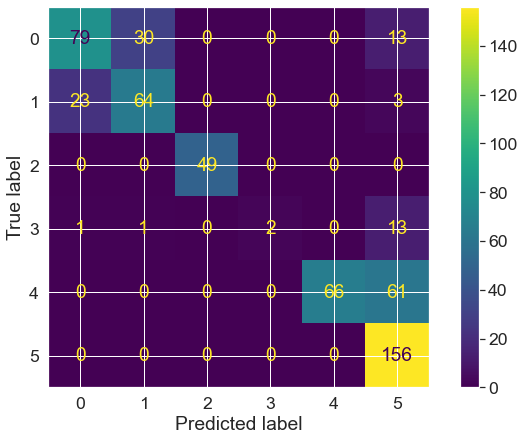

In [92]:
#------confusion_matrixDisplay----------
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
trans_pred=transform_prediction(predicted)
cm = confusion_matrix(y_test, trans_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

# Q3

# q.1

In [116]:
#-----build_model------------
def build_model(no_epoch,batch_size,x_train,y_train,x_val,y_val,l_num=1,nuran_num=10,actitivation='relu',opt=tfa.optimizers.AdamW(learning_rate = 0.001,weight_decay = 0.0001)):
  model = keras.Sequential()
  model.add(keras.layers.Flatten())
  model.add(keras.layers.Dense(10,activation = actitivation))
  for i in range(l_num-1):
    model.add(tf.keras.layers.Dense(nuran_num,activation=actitivation))
  model.add(keras.layers.Dense(6,activation = 'softmax'))

  optimizer = opt

  # Most simple tf.keras models are sequential.
  model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics='accuracy')
  callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode = "min", restore_best_weights =True)

  results= model.fit(
    x=x_train,
    y=y_train,
    shuffle=True,
    epochs=no_epoch,
    validation_data = (x_val,y_val),
    batch_size=batch_size,
      callbacks=[callback]
  )
  return model,results

In [137]:
# The following variables are the hyperparameters.
epochs = 500
batch = [32,64,128]
# Split the original training set into a reduced training set and a
# validation set. 
acctr={}
accts={}
accval={}
maxacctr={}
maxaccts={}
maxaccval={}
minacctr={}
minaccts={}
minaccval={}
avgacctr={}
avgaccts={}
avgaccval={}
for b in batch :
  train_accuracy=[]
  val_accuracy=[]
  test_accuracy=[]
  for i in range(5):
    model,results=build_model(epochs,b,x_train_new,y_train,x_val_new,y_val)
    #------predict model------
    predicted=model.predict(x_test_new)
    #------evaluate model---------
    loss,acc=model.evaluate(x_test_new,y_test)
    train_accuracy.append(np.amax(results.history['accuracy']))
    val_accuracy.append(np.amax(results.history['val_accuracy']))
    test_accuracy.append(acc)

    all_history.append(results)

  maxacctr['max of batch size='+str(b)]=np.amax(train_accuracy)
  minacctr['min of batch size='+str(b)]=np.amin(train_accuracy)
  avgacctr['avg of batch size='+str(b)]=np.average(train_accuracy)
  maxaccts['max of batch size='+str(b)]=np.amax(test_accuracy)
  minaccts['min of batch size='+str(b)]=np.amin(test_accuracy)
  avgaccts['avg of batch size='+str(b)]=np.average(test_accuracy)
  maxaccval['max of batch size='+str(b)]=np.amax(val_accuracy)
  minaccval['min of batch size='+str(b)]=np.amin(val_accuracy)
  avgaccval['avg of batch size='+str(b)]=np.average(val_accuracy)

  acctr['batch size='+str(b)]=train_accuracy
  accts['batch size='+str(b)]=test_accuracy
  accval['batch size='+str(b)]=val_accuracy


Epoch 1/500
82/82 [==============================] - 0s 2ms/step - loss: 1.2080 - accuracy: 0.5044 - val_loss: 0.9290 - val_accuracy: 0.6631
Epoch 2/500
82/82 [==============================] - 0s 775us/step - loss: 0.8686 - accuracy: 0.6491 - val_loss: 0.7949 - val_accuracy: 0.6756
Epoch 3/500
82/82 [==============================] - 0s 763us/step - loss: 0.7908 - accuracy: 0.6903 - val_loss: 0.7429 - val_accuracy: 0.7112
Epoch 4/500
82/82 [==============================] - 0s 763us/step - loss: 0.7535 - accuracy: 0.7048 - val_loss: 0.7146 - val_accuracy: 0.7130
Epoch 5/500
82/82 [==============================] - 0s 776us/step - loss: 0.7328 - accuracy: 0.7094 - val_loss: 0.6990 - val_accuracy: 0.7201
Epoch 6/500
82/82 [==============================] - 0s 763us/step - loss: 0.7199 - accuracy: 0.7167 - val_loss: 0.6854 - val_accuracy: 0.7201
Epoch 7/500
82/82 [==============================] - 0s 763us/step - loss: 0.7099 - accuracy: 0.7186 - val_loss: 0.6774 - val_accuracy: 0.7166
E

In [138]:
print('######### max training  acc ##################')
print(maxacctr)
print('######### max testung  acc ##################')
print(maxaccts)
print('######### max val  acc ##################')
print(maxaccval)
print('######### min training  acc ##################')
print(minacctr)
print('######### min testing  acc ##################')
print(minaccts)
print('######### min val  acc ##################')
print(minaccval)
print('######### avg training  acc ##################')
print(avgacctr)
print('######### avg testing  acc ##################')
print(avgaccts)
print('######### avg val  acc ##################')
print(avgaccval)

######### max training  acc ##################
{'max of batch size=32': 0.7678503394126892, 'max of batch size=64': 0.7644138932228088, 'max of batch size=128': 0.7762504816055298}
######### max testung  acc ##################
{'max of batch size=32': 0.77183598279953, 'max of batch size=64': 0.7682709693908691, 'max of batch size=128': 0.7807486653327942}
######### max val  acc ##################
{'max of batch size=32': 0.7896613478660583, 'max of batch size=64': 0.7807486653327942, 'max of batch size=128': 0.7878788113594055}
######### min training  acc ##################
{'min of batch size=32': 0.755250096321106, 'min of batch size=64': 0.7506681680679321, 'min of batch size=128': 0.7449408173561096}
######### min testing  acc ##################
{'min of batch size=32': 0.7522281408309937, 'min of batch size=64': 0.7468805909156799, 'min of batch size=128': 0.7486631274223328}
######### min val  acc ##################
{'min of batch size=32': 0.7682709693908691, 'min of batch size

# q3.2

In [119]:
# The following variables are the hyperparameters.
learning_rate = 0.001
epochs = 500
number_l = [1,2,4,8]
number_n = [10,20,30,40]
b=32
# Split the original training set into a reduced training set and a
# validation set. 
acctr={}
accts={}
accval={}
maxacctr={}
maxaccts={}
maxaccval={}
minacctr={}
minaccts={}
minaccval={}
avgacctr={}
avgaccts={}
avgaccval={}
all_history=[]

for nl in number_l :

  for nn in number_n:
    acctrnln=[]
    acctsln=[]
    accval1ln=[]
    for i in range(5):
        model,results=build_model(epochs,32,x_train_new,y_train,x_val_new,y_val,nl,nn,'relu')
         #------predict model------
        predicted=model.predict(x_test_new)
        #------evaluate model---------
        loss,acc=model.evaluate(x_test_new,y_test)
        train_accuracy.append(np.amax(results.history['accuracy']))
        val_accuracy.append(np.amax(results.history['val_accuracy']))
        test_accuracy.append(acc)

        all_history.append(results)

    maxacctr['max of num neouren='+str(nn)+'and '+str(nl)+' layers']=np.amax(train_accuracy)
    minacctr['min of num neouren='+str(nn)+'and '+str(nl)+' layers']=np.amin(train_accuracy)
    avgacctr['avg of num neouren='+str(nn)+'and '+str(nl)+' layers']=np.average(train_accuracy)
    maxaccts['max of num neouren='+str(nn)+'and '+str(nl)+' layers']=np.amax(test_accuracy)
    minaccts['min of num neouren='+str(nn)+'and '+str(nl)+' layers']=np.amin(test_accuracy)
    avgaccts['avg of num neouren='+str(nn)+'and '+str(nl)+' layers']=np.average(test_accuracy)
    maxaccval['max of num neouren='+str(nn)+'and '+str(nl)+' layers']=np.amax(val_accuracy)
    minaccval['min of num neouren='+str(nn)+'and '+str(nl)+' layers']=np.amin(val_accuracy)
    avgaccval['avg of num neouren='+str(nn)+'and '+str(nl)+' layers']=np.average(val_accuracy)  

    acctr['num neouren='+str(nn)+'and '+str(nl)+' layers']=train_accuracy
    accts['num neouren='+str(nn)+'and '+str(nl)+' layers']=test_accuracy
    accval['num neouren='+str(nn)+'and '+str(nl)+' layers']=val_accuracy


  

Epoch 1/500
82/82 [==============================] - 0s 2ms/step - loss: 1.3994 - accuracy: 0.4483 - val_loss: 1.1147 - val_accuracy: 0.5134
Epoch 2/500
82/82 [==============================] - 0s 764us/step - loss: 1.0022 - accuracy: 0.6292 - val_loss: 0.9081 - val_accuracy: 0.6916
Epoch 3/500
82/82 [==============================] - 0s 784us/step - loss: 0.8674 - accuracy: 0.6823 - val_loss: 0.8186 - val_accuracy: 0.6916
Epoch 4/500
82/82 [==============================] - 0s 763us/step - loss: 0.8065 - accuracy: 0.6949 - val_loss: 0.7773 - val_accuracy: 0.6934
Epoch 5/500
82/82 [==============================] - 0s 776us/step - loss: 0.7765 - accuracy: 0.7037 - val_loss: 0.7484 - val_accuracy: 0.7094
Epoch 6/500
82/82 [==============================] - 0s 764us/step - loss: 0.7550 - accuracy: 0.7052 - val_loss: 0.7316 - val_accuracy: 0.7112
Epoch 7/500
82/82 [==============================] - 0s 724us/step - loss: 0.7398 - accuracy: 0.7117 - val_loss: 0.7160 - val_accuracy: 0.7184
E

In [120]:
print('######### max training  acc ##################')
print(maxacctr)
print('######### max testung  acc ##################')
print(maxaccts)
print('######### max val  acc ##################')
print(maxaccval)
print('######### min training  acc ##################')
print(minacctr)
print('######### min testing  acc ##################')
print(minaccts)
print('######### min val  acc ##################')
print(minaccval)
print('######### avg training  acc ##################')
print(avgacctr)
print('######### avg testing  acc ##################')
print(avgaccts)
print('######### avg val  acc ##################')
print(avgaccval)

######### max training  acc ##################
{'max of num neouren=10and 1 layers': 0.8247422575950623, 'max of num neouren=20and 1 layers': 0.8247422575950623, 'max of num neouren=30and 1 layers': 0.8247422575950623, 'max of num neouren=40and 1 layers': 0.8247422575950623, 'max of num neouren=10and 2 layers': 0.8247422575950623, 'max of num neouren=20and 2 layers': 0.8247422575950623, 'max of num neouren=30and 2 layers': 0.8247422575950623, 'max of num neouren=40and 2 layers': 0.8247422575950623, 'max of num neouren=10and 4 layers': 0.8247422575950623, 'max of num neouren=20and 4 layers': 0.8247422575950623, 'max of num neouren=30and 4 layers': 0.8247422575950623, 'max of num neouren=40and 4 layers': 0.8247422575950623, 'max of num neouren=10and 8 layers': 0.8247422575950623, 'max of num neouren=20and 8 layers': 0.8247422575950623, 'max of num neouren=30and 8 layers': 0.8247422575950623, 'max of num neouren=40and 8 layers': 0.8247422575950623}
######### max testung  acc #############

In [123]:
neoran_10=[avgaccts['avg of num neouren=10and 1 layers'],avgaccts['avg of num neouren=10and 2 layers'],
           avgaccts['avg of num neouren=10and 4 layers'],avgaccts['avg of num neouren=10and 8 layers']]
neoran_20=[avgaccts['avg of num neouren=20and 1 layers'],avgaccts['avg of num neouren=20and 2 layers'],
           avgaccts['avg of num neouren=20and 4 layers'],avgaccts['avg of num neouren=20and 8 layers']]
neoran_30=[avgaccts['avg of num neouren=30and 1 layers'],avgaccts['avg of num neouren=30and 2 layers'],
           avgaccts['avg of num neouren=30and 4 layers'],avgaccts['avg of num neouren=30and 8 layers']]
neoran_40=[avgaccts['avg of num neouren=40and 1 layers'],avgaccts['avg of num neouren=40and 2 layers'],
           avgaccts['avg of num neouren=40and 4 layers'],avgaccts['avg of num neouren=40and 8 layers']]


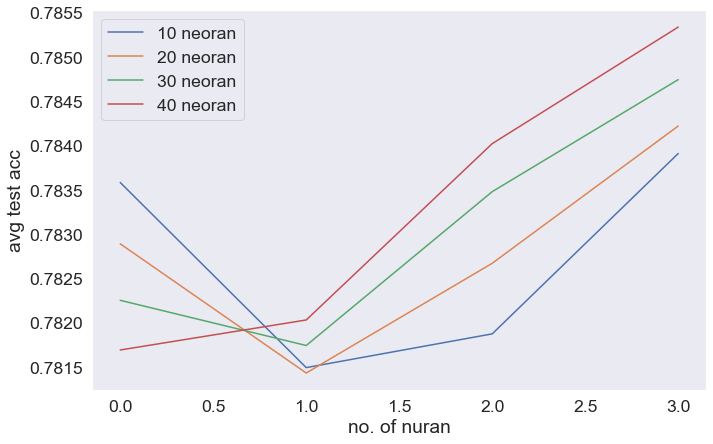

In [124]:
#plot Accuracy vs number of component
from matplotlib import figure
plt.plot(neoran_10)
plt.plot(neoran_20)
plt.plot(neoran_30)
plt.plot(neoran_40)

plt.legend(['10 neoran', '20 neoran','30 neoran','40 neoran']) 
plt.xlabel("no. of nuran")
plt.ylabel("avg test acc")
plt.grid()

# q3.3

In [125]:
# The following variables are the hyperparameters.

epochs = 500
learning_rate = [.1,.01,.001]
momin=[.1,.5,.9]
nl=8
nn=40
# Split the original training set into a reduced training set and a
# validation set. 
acctr={}
accts={}
accval={}
maxacctr={}
maxaccts={}
maxaccval={}
minacctr={}
minaccts={}
minaccval={}
avgacctr={}
avgaccts={}
avgaccval={}
for lr in learning_rate :
  train_accuracy=[]
  val_accuracy=[]
  test_accuracy=[]
  for i in range(5):

    opt=tfa.optimizers.AdamW(learning_rate = lr,weight_decay = 0.0001)
    model,results=build_model(epochs,32,x_train_new,y_train,x_val_new,y_val,nl,nn,'relu',opt)
    #------predict model------
    predicted=model.predict(x_test_new)
    #------evaluate model---------
    loss,acc=model.evaluate(x_test_new,y_test)
    train_accuracy.append(np.amax(results.history['accuracy']))
    val_accuracy.append(np.amax(results.history['val_accuracy']))
    test_accuracy.append(acc)

    all_history.append(results)

  maxacctr['max learning_rate='+str(lr)+'and and optimizer is adamW']=np.amax(train_accuracy)
  minacctr['min learning_rate='+str(lr)+'and and optimizer is adamW']=np.amin(train_accuracy)
  avgacctr['avg learning_rate='+str(lr)+'and and optimizer is adamW']=np.average(train_accuracy)
  maxaccts['max learning_rate='+str(lr)+'and and optimizer is adamW']=np.amax(test_accuracy)
  minaccts['min learning_rate='+str(lr)+'and and optimizer is adamW']=np.amin(test_accuracy)
  avgaccts['avg learning_rate='+str(lr)+'and and optimizer is adamW']=np.average(test_accuracy)
  maxaccval['max learning_rate='+str(lr)+'and and optimizer is adamW']=np.amax(val_accuracy)
  minaccval['min learning_rate='+str(lr)+'and and optimizer is adamW']=np.amin(val_accuracy)
  avgaccval['avg learning_rate='+str(lr)+'and and optimizer is adamW']=np.average(val_accuracy)   

  acctr['learning_rate='+str(lr)+'and and optimizer is adamW']=train_accuracy
  accts['learning_rate='+str(lr)+'and and optimizer is adamW']=test_accuracy
  accval['learning_rate='+str(lr)+'and and optimizer is adamW']=val_accuracy
  for m in momin:
      train_accuracy=[]
      val_accuracy=[]
      test_accuracy=[]

      for i in range(5):

        opt=tf.keras.optimizers.SGD(learning_rate=lr, momentum=0.0, )
        model,results=build_model(epochs,32,x_train_new,y_train,x_val_new,y_val,nl,nn,'relu',opt)
         #------predict model------
        predicted=model.predict(x_test_new)
        #------evaluate model---------
        loss,acc=model.evaluate(x_test_new,y_test)
        train_accuracy.append(np.amax(results.history['accuracy']))
        val_accuracy.append(np.amax(results.history['val_accuracy']))
        test_accuracy.append(acc)

        all_history.append(results)

      maxacctr['max learning_rate='+str(lr)+'and optimizer is SGD with momentum='+str(m)]=np.amax(train_accuracy)
      minacctr['min learning_rate='+str(lr)+'and optimizer is SGD with momentum='+str(m)]=np.amin(train_accuracy)
      avgacctr['avg learning_rate='+str(lr)+'and optimizer is SGD with momentum='+str(m)]=np.average(train_accuracy)
      maxaccts['max learning_rate='+str(lr)+'and optimizer is SGD with momentum='+str(m)]=np.amax(test_accuracy)
      minaccts['min learning_rate='+str(lr)+'and optimizer is SGD with momentum='+str(m)]=np.amin(test_accuracy)
      avgaccts['avg learning_rate='+str(lr)+'and optimizer is SGD with momentum='+str(m)]=np.average(test_accuracy)
      maxaccval['max learning_rate='+str(lr)+'and optimizer is SGD with momentum='+str(m)]=np.amax(val_accuracy)
      minaccval['min learning_rate='+str(lr)+'and optimizer is SGD with momentum='+str(m)]=np.amin(val_accuracy)
      avgaccval['avg learning_rate='+str(lr)+'and optimizer is SGD with momentum='+str(m)]=np.average(val_accuracy)

      acctr['learning_rate='+str(lr)+'and optimizer is SGD with momentum='+str(m)]=train_accuracy
      accts['learning_rate='+str(lr)+'and optimizer is SGD with momentum='+str(m)]=test_accuracy
      accval['learning_rate='+str(lr)+'and optimizer is SGD with momentum='+str(m)]=val_accuracy
  train_accuracy=[]
  val_accuracy=[]
  test_accuracy=[]
  for i in range(5):

    opt=tf.keras.optimizers.RMSprop(learning_rate=lr)
    model,results=build_model(epochs,32,x_train_new,y_train,x_val_new,y_val,nl,nn,'relu',opt)
    #------predict model------
    predicted=model.predict(x_test_new)
    #------evaluate model---------
    loss,acc=model.evaluate(x_test_new,y_test)
    train_accuracy.append(np.amax(results.history['accuracy']))
    val_accuracy.append(np.amax(results.history['val_accuracy']))
    test_accuracy.append(acc)

    all_history.append(results)

  maxacctr['max learning_rate='+str(lr)+'and and optimizer is RMSprop']=np.amax(train_accuracy)
  minacctr['min learning_rate='+str(lr)+'and and optimizer is RMSprop']=np.amin(train_accuracy)
  avgacctr['avg learning_rate='+str(lr)+'and and optimizer is RMSprop']=np.average(train_accuracy)
  maxaccts['max learning_rate='+str(lr)+'and and optimizer is RMSprop']=np.amax(test_accuracy)
  minaccts['min learning_rate='+str(lr)+'and and optimizer is RMSprop']=np.amin(test_accuracy)
  avgaccts['avg learning_rate='+str(lr)+'and and optimizer is RMSprop']=np.average(test_accuracy)
  maxaccval['max learning_rate='+str(lr)+'and and optimizer is RMSprop']=np.amax(val_accuracy)
  minaccval['min learning_rate='+str(lr)+'and and optimizer is RMSprop']=np.amin(val_accuracy)
  avgaccval['avg learning_rate='+str(lr)+'and and optimizer is RMSprop']=np.average(val_accuracy)   

  acctr['learning_rate='+str(lr)+'and and optimizer is RMSprop']=train_accuracy
  accts['learning_rate='+str(lr)+'and and optimizer is RMSprop']=test_accuracy
  accval['learning_rate='+str(lr)+'and and optimizer is RMSprop']=val_accuracy 

Epoch 1/500
82/82 [==============================] - 1s 2ms/step - loss: 1.7117 - accuracy: 0.3242 - val_loss: 1.3789 - val_accuracy: 0.3476
Epoch 2/500
82/82 [==============================] - 0s 978us/step - loss: 1.3417 - accuracy: 0.3574 - val_loss: 1.2923 - val_accuracy: 0.3832
Epoch 3/500
82/82 [==============================] - 0s 971us/step - loss: 1.1461 - accuracy: 0.4822 - val_loss: 1.3696 - val_accuracy: 0.4189
Epoch 4/500
82/82 [==============================] - 0s 988us/step - loss: 1.2767 - accuracy: 0.4150 - val_loss: 1.2326 - val_accuracy: 0.4314
Epoch 5/500
82/82 [==============================] - 0s 977us/step - loss: 1.3199 - accuracy: 0.3929 - val_loss: 1.4835 - val_accuracy: 0.2656
Epoch 6/500
82/82 [==============================] - 0s 977us/step - loss: 1.4067 - accuracy: 0.3604 - val_loss: 1.2934 - val_accuracy: 0.4421
Epoch 7/500
82/82 [==============================] - 0s 980us/step - loss: 1.3611 - accuracy: 0.3746 - val_loss: 1.3021 - val_accuracy: 0.3422
E

In [126]:
print('######### max training  acc ##################')
print(maxacctr)
print('######### max testung  acc ##################')
print(maxaccts)
print('######### max val  acc ##################')
print(maxaccval)
print('######### min training  acc ##################')
print(minacctr)
print('######### min testing  acc ##################')
print(minaccts)
print('######### min val  acc ##################')
print(minaccval)
print('######### avg training  acc ##################')
print(avgacctr)
print('######### avg testing  acc ##################')
print(avgaccts)
print('######### avg val  acc ##################')
print(avgaccval)

######### max training  acc ##################
{'max learning_rate=0.1and and optimizer is adamW': 0.4822451174259186, 'max learning_rate=0.1and optimizer is SGD with momentum=0.1': 0.7640320658683777, 'max learning_rate=0.1and optimizer is SGD with momentum=0.5': 0.7835051417350769, 'max learning_rate=0.1and optimizer is SGD with momentum=0.9': 0.7842687964439392, 'max learning_rate=0.1and and optimizer is RMSprop': 0.3318060338497162, 'max learning_rate=0.01and and optimizer is adamW': 0.7731958627700806, 'max learning_rate=0.01and optimizer is SGD with momentum=0.1': 0.7636502385139465, 'max learning_rate=0.01and optimizer is SGD with momentum=0.5': 0.788850724697113, 'max learning_rate=0.01and optimizer is SGD with momentum=0.9': 0.7747231721878052, 'max learning_rate=0.01and and optimizer is RMSprop': 0.7670866847038269, 'max learning_rate=0.001and and optimizer is adamW': 0.7972508668899536, 'max learning_rate=0.001and optimizer is SGD with momentum=0.1': 0.7701413035392761, 'max

# q3.4


In [129]:
# The following variables are the hyperparameters.

epochs = 500
nl=8
nn=40
lr=.001
opt=tf.keras.optimizers.RMSprop(learning_rate=lr)
activation = ['relu',tf.nn.leaky_relu,'sigmoid','tanh']
# Split the original training set into a reduced training set and a
# validation set. 
acctr={}
accts={}
accval={}
maxacctr={}
maxaccts={}
maxaccval={}
minacctr={}
minaccts={}
minaccval={}
avgacctr={}
avgaccts={}
avgaccval={}
for act in activation :
  train_accuracy=[]
  val_accuracy=[]
  test_accuracy=[]
  for i in range(5):
    model,results=build_model(epochs,32,x_train_new,y_train,x_val_new,y_val,nl,nn,act,opt)
    #------predict model------
    predicted=model.predict(x_test_new)
    #------evaluate model---------
    loss,acc=model.evaluate(x_test_new,y_test)
    train_accuracy.append(np.amax(results.history['accuracy']))
    val_accuracy.append(np.amax(results.history['val_accuracy']))
    test_accuracy.append(acc)

    all_history.append(results)

  maxacctr['max of activation='+str(act)]=np.amax(train_accuracy)
  minacctr['min of activation='+str(act)]=np.amin(train_accuracy)
  avgacctr['avg of activation='+str(act)]=np.average(train_accuracy)
  maxaccts['max of activation='+str(act)]=np.amax(test_accuracy)
  minaccts['min of activation='+str(act)]=np.amin(test_accuracy)
  avgaccts['avg of activation='+str(act)]=np.average(test_accuracy)
  maxaccval['max of activation='+str(act)]=np.amax(val_accuracy)
  minaccval['min of activation='+str(act)]=np.amin(val_accuracy)
  avgaccval['avg of activation='+str(act)]=np.average(val_accuracy)  

  acctr['activation='+str(act)]=train_accuracy
  accts['activation='+str(act)]=test_accuracy
  accval['activation='+str(act)]=val_accuracy


Epoch 1/500
82/82 [==============================] - 1s 2ms/step - loss: 1.2307 - accuracy: 0.4952 - val_loss: 0.8531 - val_accuracy: 0.6381
Epoch 2/500
82/82 [==============================] - 0s 926us/step - loss: 0.8192 - accuracy: 0.6541 - val_loss: 0.7666 - val_accuracy: 0.6578
Epoch 3/500
82/82 [==============================] - 0s 917us/step - loss: 0.7369 - accuracy: 0.6720 - val_loss: 0.6543 - val_accuracy: 0.7184
Epoch 4/500
82/82 [==============================] - 0s 924us/step - loss: 0.6909 - accuracy: 0.7026 - val_loss: 0.6358 - val_accuracy: 0.7255
Epoch 5/500
82/82 [==============================] - 0s 923us/step - loss: 0.6665 - accuracy: 0.7140 - val_loss: 0.6227 - val_accuracy: 0.7184
Epoch 6/500
82/82 [==============================] - 0s 927us/step - loss: 0.6539 - accuracy: 0.7209 - val_loss: 0.6172 - val_accuracy: 0.7273
Epoch 7/500
82/82 [==============================] - 0s 911us/step - loss: 0.6322 - accuracy: 0.7320 - val_loss: 0.6142 - val_accuracy: 0.7451
E

In [130]:
print('######### max training  acc ##################')
print(maxacctr)
print('######### max testung  acc ##################')
print(maxaccts)
print('######### max val  acc ##################')
print(maxaccval)
print('######### min training  acc ##################')
print(minacctr)
print('######### min testing  acc ##################')
print(minaccts)
print('######### min val  acc ##################')
print(minaccval)
print('######### avg training  acc ##################')
print(avgacctr)
print('######### avg testing  acc ##################')
print(avgaccts)
print('######### avg val  acc ##################')
print(avgaccval)

######### max training  acc ##################
{'max of activation=relu': 0.8045055270195007, 'max of activation=<function leaky_relu at 0x00000246220D8280>': 0.7907598614692688, 'max of activation=sigmoid': 0.5150821208953857, 'max of activation=tanh': 0.8113783597946167}
######### max testung  acc ##################
{'max of activation=relu': 0.832442045211792, 'max of activation=<function leaky_relu at 0x00000246220D8280>': 0.8021390438079834, 'max of activation=sigmoid': 0.5561497211456299, 'max of activation=tanh': 0.8217468857765198}
######### max val  acc ##################
{'max of activation=relu': 0.8181818127632141, 'max of activation=<function leaky_relu at 0x00000246220D8280>': 0.8021390438079834, 'max of activation=sigmoid': 0.5508021116256714, 'max of activation=tanh': 0.8253119587898254}
######### min training  acc ##################
{'min of activation=relu': 0.7766323089599609, 'min of activation=<function leaky_relu at 0x00000246220D8280>': 0.757922887802124, 'min of

Epoch 1/500
82/82 [==============================] - 1s 2ms/step - loss: 0.9662 - accuracy: 0.5823 - val_loss: 0.7549 - val_accuracy: 0.5989
Epoch 2/500
82/82 [==============================] - 0s 941us/step - loss: 0.7675 - accuracy: 0.6621 - val_loss: 0.6858 - val_accuracy: 0.7166
Epoch 3/500
82/82 [==============================] - 0s 919us/step - loss: 0.7239 - accuracy: 0.6777 - val_loss: 0.6892 - val_accuracy: 0.6684
Epoch 4/500
82/82 [==============================] - 0s 924us/step - loss: 0.6946 - accuracy: 0.7068 - val_loss: 0.6592 - val_accuracy: 0.6649
Epoch 5/500
82/82 [==============================] - 0s 928us/step - loss: 0.6679 - accuracy: 0.7167 - val_loss: 0.6579 - val_accuracy: 0.7130
Epoch 6/500
82/82 [==============================] - 0s 924us/step - loss: 0.6535 - accuracy: 0.7171 - val_loss: 0.6250 - val_accuracy: 0.7362
Epoch 7/500
82/82 [==============================] - 0s 916us/step - loss: 0.6411 - accuracy: 0.7285 - val_loss: 0.6208 - val_accuracy: 0.6988
E

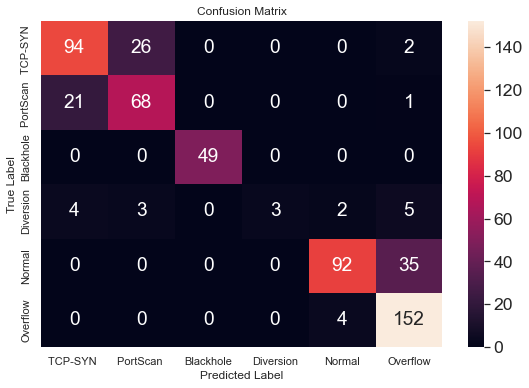

Epoch 1/500
82/82 [==============================] - 1s 2ms/step - loss: 0.9375 - accuracy: 0.6197 - val_loss: 0.7385 - val_accuracy: 0.7130
Epoch 2/500
82/82 [==============================] - 0s 940us/step - loss: 0.7338 - accuracy: 0.6800 - val_loss: 0.6741 - val_accuracy: 0.6756
Epoch 3/500
82/82 [==============================] - 0s 923us/step - loss: 0.6915 - accuracy: 0.7006 - val_loss: 0.6577 - val_accuracy: 0.7255
Epoch 4/500
82/82 [==============================] - 0s 911us/step - loss: 0.6711 - accuracy: 0.7132 - val_loss: 0.6801 - val_accuracy: 0.6809
Epoch 5/500
82/82 [==============================] - 0s 925us/step - loss: 0.6464 - accuracy: 0.7327 - val_loss: 0.6014 - val_accuracy: 0.7415
Epoch 6/500
82/82 [==============================] - 0s 899us/step - loss: 0.6299 - accuracy: 0.7392 - val_loss: 0.6524 - val_accuracy: 0.6667
Epoch 7/500
82/82 [==============================] - 0s 908us/step - loss: 0.6181 - accuracy: 0.7480 - val_loss: 0.5633 - val_accuracy: 0.7683
E

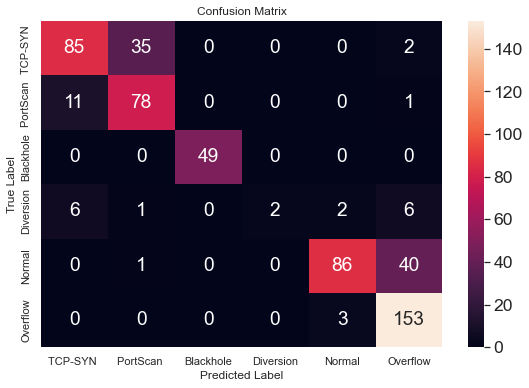

Epoch 1/500
82/82 [==============================] - 1s 2ms/step - loss: 0.9695 - accuracy: 0.6029 - val_loss: 0.8230 - val_accuracy: 0.6667
Epoch 2/500
82/82 [==============================] - 0s 916us/step - loss: 0.7811 - accuracy: 0.6747 - val_loss: 0.7117 - val_accuracy: 0.6988
Epoch 3/500
82/82 [==============================] - 0s 919us/step - loss: 0.7108 - accuracy: 0.7090 - val_loss: 0.6703 - val_accuracy: 0.7184
Epoch 4/500
82/82 [==============================] - 0s 924us/step - loss: 0.6726 - accuracy: 0.7163 - val_loss: 0.6680 - val_accuracy: 0.6845
Epoch 5/500
82/82 [==============================] - 0s 948us/step - loss: 0.6476 - accuracy: 0.7289 - val_loss: 0.6114 - val_accuracy: 0.7273
Epoch 6/500
82/82 [==============================] - 0s 973us/step - loss: 0.6401 - accuracy: 0.7388 - val_loss: 0.6071 - val_accuracy: 0.7504
Epoch 7/500
82/82 [==============================] - 0s 960us/step - loss: 0.6269 - accuracy: 0.7362 - val_loss: 0.5948 - val_accuracy: 0.7611
E

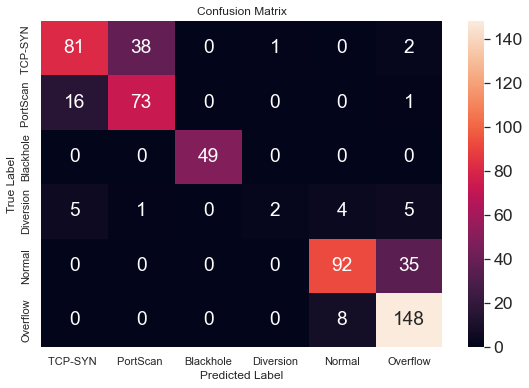

Epoch 1/500
82/82 [==============================] - 1s 2ms/step - loss: 0.9499 - accuracy: 0.6132 - val_loss: 0.7504 - val_accuracy: 0.6453
Epoch 2/500
82/82 [==============================] - 0s 923us/step - loss: 0.7519 - accuracy: 0.6781 - val_loss: 0.6957 - val_accuracy: 0.7112
Epoch 3/500
82/82 [==============================] - 0s 936us/step - loss: 0.7159 - accuracy: 0.6953 - val_loss: 0.6758 - val_accuracy: 0.7237
Epoch 4/500
82/82 [==============================] - 0s 911us/step - loss: 0.6835 - accuracy: 0.7075 - val_loss: 0.7025 - val_accuracy: 0.6453
Epoch 5/500
82/82 [==============================] - 0s 935us/step - loss: 0.6612 - accuracy: 0.7178 - val_loss: 0.6411 - val_accuracy: 0.7184
Epoch 6/500
82/82 [==============================] - 0s 924us/step - loss: 0.6481 - accuracy: 0.7213 - val_loss: 0.6222 - val_accuracy: 0.7184
Epoch 7/500
82/82 [==============================] - 0s 914us/step - loss: 0.6357 - accuracy: 0.7308 - val_loss: 0.6191 - val_accuracy: 0.7380
E

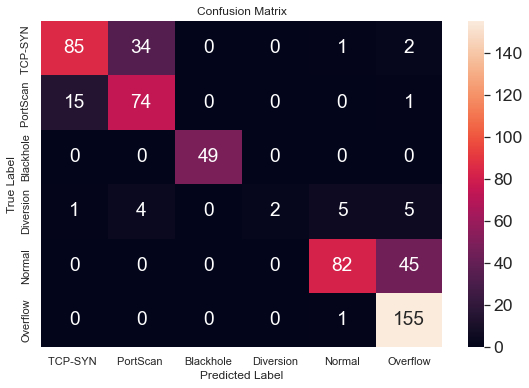

Epoch 1/500
82/82 [==============================] - 1s 2ms/step - loss: 0.9706 - accuracy: 0.5998 - val_loss: 0.7399 - val_accuracy: 0.6988
Epoch 2/500
82/82 [==============================] - 0s 922us/step - loss: 0.7756 - accuracy: 0.6628 - val_loss: 0.7386 - val_accuracy: 0.6774
Epoch 3/500
82/82 [==============================] - 0s 923us/step - loss: 0.7222 - accuracy: 0.6949 - val_loss: 0.7043 - val_accuracy: 0.7148
Epoch 4/500
82/82 [==============================] - 0s 923us/step - loss: 0.6849 - accuracy: 0.7163 - val_loss: 0.6454 - val_accuracy: 0.7344
Epoch 5/500
82/82 [==============================] - 0s 918us/step - loss: 0.6571 - accuracy: 0.7266 - val_loss: 0.6270 - val_accuracy: 0.7469
Epoch 6/500
82/82 [==============================] - 0s 920us/step - loss: 0.6391 - accuracy: 0.7415 - val_loss: 0.5790 - val_accuracy: 0.7558
Epoch 7/500
82/82 [==============================] - 0s 899us/step - loss: 0.6228 - accuracy: 0.7453 - val_loss: 0.5885 - val_accuracy: 0.7344
E

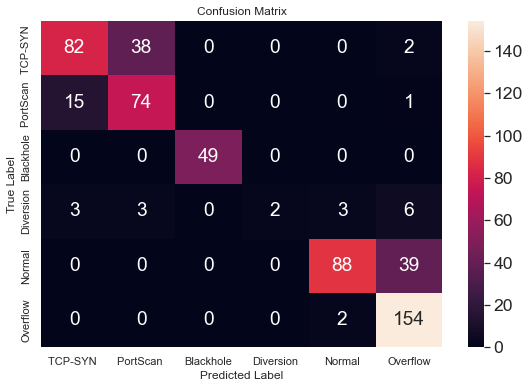

In [139]:
epochs = 500
nl=8
nn=40
lr=.001
opt=tf.keras.optimizers.RMSprop(learning_rate=lr)
activation = 'relu'
confusion=[]
for i in range(5):
    model,results=build_model(epochs,32,x_train_new,y_train,x_val_new,y_val,nl,nn,act,opt)
    #------predict model------
    predicted=model.predict(x_test_new)
    #------evaluate model---------
    loss,acc=model.evaluate(x_test_new,y_test)
    train_accuracy.append(np.amax(results.history['accuracy']))
    val_accuracy.append(np.amax(results.history['val_accuracy']))
    test_accuracy.append(acc)
    y_pred = np.argmax(predicted, axis=1)
    data= confusion_matrix(y_test, y_pred)
    confusion.append(data)
    labels =['TCP-SYN ','PortScan ','Blackhole','Diversion','Normal','Overflow']
    plot_confusion_matrix(data,labels)

In [140]:
avg_confusion=get_average_confusion(confusion)


In [141]:
avg_confusion

,0,1,2,3,4,5
0,85.0,34.0,0.0,0.0,0.0,2.0
1,16.0,73.0,0.0,0.0,0.0,1.0
2,0.0,0.0,49.0,0.0,0.0,0.0
3,4.0,2.0,0.0,2.0,3.0,5.0
4,0.0,0.0,0.0,0.0,88.0,39.0
5,0.0,0.0,0.0,0.0,4.0,152.0


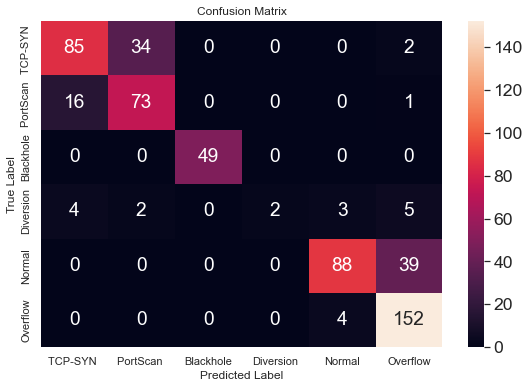

In [142]:
plot_confusion_matrix(np.array(avg_confusion),labels)

In [144]:
#-----build_model------------
def improv_build_model(no_epoch,batch_size,x_train,y_train,x_val,y_val):
  model = keras.Sequential()
  model.add(keras.layers.Dense(512, input_shape = (x_train_new.shape[1],),activation = 'relu'))
  model.add(keras.layers.Dense(256,activation = 'relu'))
  model.add(keras.layers.Dense(128,activation = 'relu'))
  model.add(keras.layers.Dense(64,activation = 'relu'))
  model.add(keras.layers.Dense(32,activation = 'relu'))
  model.add(keras.layers.Dense(16, activation = 'relu'))
  model.add(keras.layers.Dense(6,activation = 'softmax'))

  optimizer = tf.keras.optimizers.RMSprop(learning_rate=.001)

  # Most simple tf.keras models are sequential.
  model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics='accuracy')
  callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode = "min", restore_best_weights =True)

  results= model.fit(
    x=x_train,
    y=y_train,
    shuffle=True,
    epochs=no_epoch,
    validation_data = (x_val,y_val),
    batch_size=batch_size,
      callbacks=[callback]
  )
  return model,results
  

  
   

In [149]:
# The following variables are the hyperparameters.

epochs = 500

# Split the original training set into a reduced training set and a
# validation set. 
acctr={}
accts={}
accval={}
maxacctr={}
maxaccts={}
maxaccval={}
minacctr={}
minaccts={}
minaccval={}
avgacctr={}
avgaccts={}
avgaccval={}

for i in range(5):
    model,results=improv_build_model(epochs,16,x_train_new,y_train,x_val_new,y_val)
    #------predict model------
    predicted=model.predict(x_test_new)
    #------evaluate model---------
    loss,acc=model.evaluate(x_test_new,y_test)
    train_accuracy.append(np.amax(results.history['accuracy']))
    val_accuracy.append(np.amax(results.history['val_accuracy']))
    test_accuracy.append(acc)

    all_history.append(results)

maxacctr['max of training accuracy for the model']=np.amax(train_accuracy)
minacctr['min of training accuracy for the model']=np.amin(train_accuracy)
avgacctr['avg of training accuracy for the model']=np.average(train_accuracy)
maxaccts['max of testing accuracy for the model']=np.amax(test_accuracy)
minaccts['min of testing accuracy for the model']=np.amin(test_accuracy)
avgaccts['avg of testing accuracy for the model']=np.average(test_accuracy)
maxaccval['max of val accuracy for the model']=np.amax(val_accuracy)
minaccval['min of val accuracy for the model']=np.amin(val_accuracy)
avgaccval['avg of val accuracy for the model']=np.average(val_accuracy)  

acctr['activation='+str(act)]=train_accuracy
accts['activation='+str(act)]=test_accuracy
accval['activation='+str(act)]=val_accuracy


Epoch 1/500
164/164 [==============================] - 1s 2ms/step - loss: 0.8623 - accuracy: 0.6399 - val_loss: 0.6718 - val_accuracy: 0.7023
Epoch 2/500
164/164 [==============================] - 0s 1ms/step - loss: 0.6867 - accuracy: 0.7117 - val_loss: 0.5569 - val_accuracy: 0.7665
Epoch 3/500
164/164 [==============================] - 0s 1ms/step - loss: 0.6292 - accuracy: 0.7384 - val_loss: 0.5425 - val_accuracy: 0.7807
Epoch 4/500
164/164 [==============================] - 0s 2ms/step - loss: 0.6073 - accuracy: 0.7480 - val_loss: 0.5277 - val_accuracy: 0.7772
Epoch 5/500
164/164 [==============================] - 0s 1ms/step - loss: 0.5924 - accuracy: 0.7606 - val_loss: 0.5256 - val_accuracy: 0.7986
Epoch 6/500
164/164 [==============================] - 0s 1ms/step - loss: 0.5793 - accuracy: 0.7701 - val_loss: 0.6362 - val_accuracy: 0.7629
Epoch 7/500
164/164 [==============================] - 0s 1ms/step - loss: 0.5770 - accuracy: 0.7713 - val_loss: 0.4974 - val_accuracy: 0.8039

In [150]:
print('######### max training  acc ##################')
print(maxacctr)
print('######### max testung  acc ##################')
print(maxaccts)
print('######### max val  acc ##################')
print(maxaccval)
print('######### min training  acc ##################')
print(minacctr)
print('######### min testing  acc ##################')
print(minaccts)
print('######### min val  acc ##################')
print(minaccval)
print('######### avg training  acc ##################')
print(avgacctr)
print('######### avg testing  acc ##################')
print(avgaccts)
print('######### avg val  acc ##################')
print(avgaccval)

######### max training  acc ##################
{'max of training accuracy for the model': 0.8205422163009644}
######### max testung  acc ##################
{'max of testing accuracy for the model': 0.8520498871803284}
######### max val  acc ##################
{'max of val accuracy for the model': 0.8342245817184448}
######### min training  acc ##################
{'min of training accuracy for the model': 0.7709048986434937}
######### min testing  acc ##################
{'min of testing accuracy for the model': 0.7682709693908691}
######### min val  acc ##################
{'min of val accuracy for the model': 0.7896613478660583}
######### avg training  acc ##################
{'avg of training accuracy for the model': 0.799694542090098}
######### avg testing  acc ##################
{'avg of testing accuracy for the model': 0.8173499743143717}
######### avg val  acc ##################
{'avg of val accuracy for the model': 0.8154486060142517}
